# Imports

In [1]:
import torch

print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

True
3
NVIDIA GeForce RTX 3090


In [ ]:
from orbit_generation.constants import EM_MU
from orbit_generation.data import TSFeatureWiseScaler, create_dataloaders, discard_random_labels, remove_duplicates_preserve_order, order_labels_and_array_with_target
from orbit_generation.processing import reorder_orbits, interpolate_equal_times
from orbit_generation.visualize import export_dynamic_orbits_html, visualize_static_orbits, export_dynamic_orbits_html
from orbit_generation.stats import plot_histograms_comparison
from orbit_generation.dataset import get_first_period_dataset, get_orbit_classes
from orbit_generation.model_factory import get_model
from orbit_generation.architectures import VAELossHistory
from orbit_generation.propagation import jacobi_constant, calculate_errors_per_orbit
from orbit_generation.experiment import setup_new_experiment, add_experiment_metrics, plot_corr_matrix, get_experiment_data
from orbit_generation.evaluation import evaluate_clustering_multiple_labels, find_nearest_orbits_batch, calculate_pairwise_orbit_distances, calculate_distances_batch, find_nearest_points_batch, calculate_pairwise_distances, find_nearest_orbits
from orbit_generation.latent_space import sample_random_distributions, plot_2d_latent_space, plot_combined_2d_latent_space, reduce_dimensions_latent_space, compute_centroids, grid_sample
from orbit_generation.convergence import process_diferential_correction_orbits

In [3]:
import numpy as np
import pandas as pd
import os
from pytorch_lightning import Trainer

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Parameters

In [4]:
want_to_train = True   # Set this parameter to False if you want to load the model from the folder
want_to_generate = True    # Set this parameter to False if you want to load the generation from the folder
calculate_error_metrics = True   # Set this parameter to False if you don't want to calculate any metric
want_to_get_cluster_metrics = True    # Set this parameter to False if you don't want to calculate clustering metrics
want_to_perform_convergence = True   # Set this parameter to False if you don't want to perform convergence
want_to_discover = True            # Set this parameter to False if you don't want to study the discovery

assert want_to_train==want_to_discover

In [5]:
data_path = r"/orbit-generation/data/orbits_fix_1500/EM_N_fix_1500.h5"
experiments_folder = "../experiments"

In [ ]:
# parameters
data_used = "default_data"
families_to_discard = 10
seq_len = 100
feature_dim = 7
epochs = 15
val_split = 0.05
batch_size = 32
lr = 0.001
model_name = "inception_time_wp_vae"
latent_dim = 2
model_kwargs = {'beta': 1, 'n_filters': 32, 'kernel_sizes': [3, 5, 13], 'bottleneck_channels': 32}
max_iter_convergence = 20
input_seq_len_convergence = 100
samples_to_generate = 100
distance_metric = "euclidean"

In [ ]:
# Construct the params dictionary
params = {
    # Data
    'data_used': data_used,
    'families_to_discard': families_to_discard,
    'seq_len': seq_len,
    'feature_dim': feature_dim,
    # Training
    'epochs': epochs,
    'val_split': val_split,
    'batch_size': batch_size,
    'lr': lr,
    # Model
    'model_name': model_name,
    'latent_dim': latent_dim,
    'model_kwargs': model_kwargs,
    # Convergence
    'max_iter_convergence': max_iter_convergence,
    'input_seq_len_convergence': input_seq_len_convergence,
    # Evaluation
    'samples_to_generate': samples_to_generate,
    'distance_metric': distance_metric
}

# Saving paths

In [ ]:
# Experiment
experiment_folder = setup_new_experiment(params, experiments_folder)
images_folder = os.path.join(experiment_folder, 'images')
if not os.path.exists(images_folder):
    os.makedirs(images_folder)
experiment_id = int(os.path.basename(experiment_folder).split('_')[1])

Parameters already exist for experiment: ../experiments/experiment_23


In [9]:
# Images
## Orbits
static_all_orbit_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits.png')
dynamic_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits.html')
refined_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_refined_orbits.png')
dynamical_refined_orbits_path = os.path.join(images_folder, f'exp{experiment_id}_refined_orbits.html')
generated_orbits_that_converged_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits_that_converged.png')
generated_orbits_that_did_not_converged_path = os.path.join(images_folder, f'exp{experiment_id}_generated_orbits_that_not_converged.png')
## Latent Spaces
latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_latent_space')
full_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_full_latent_space')
discarded_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_discarded_latent_space')
combined_latent_space_path = os.path.join(images_folder, f'exp{experiment_id}_combined_latent_space')
combined_latent_space_arrows_path = os.path.join(images_folder, f'exp{experiment_id}_combined_latent_space_arrows')
family_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_family_centroids')
full_family_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_full_family_centroids')
## Feature Spaces
features_plot_path = os.path.join(images_folder, f'exp{experiment_id}_features')
family_feature_centroids_plot_path = os.path.join(images_folder, f'exp{experiment_id}_family_feature_centroids')
## Other
model_losses_path = os.path.join(images_folder, f'exp{experiment_id}_model_losses.png')
histogram_comparison_path = os.path.join(images_folder, f'exp{experiment_id}_histogram_comparison.png')
full_histogram_comparison_path = os.path.join(images_folder, f'exp{experiment_id}_full_histogram_comparison.png')

# Model
model_save_path = os.path.join(experiment_folder, f'exp{experiment_id}_model.pth')

# Orbits
generated_data_path = os.path.join(experiment_folder, f'exp{experiment_id}_generated_orbits.npy')
refined_data_path = os.path.join(experiment_folder, f'exp{experiment_id}_refined_orbits.npy')

# Latent Representations
latent_representations_path = os.path.join(experiment_folder, f'exp{experiment_id}_latent_representations.npy')
family_centroids_path = os.path.join(experiment_folder, f'exp{experiment_id}_family_centroids.npy')

# Features
generation_df_path = os.path.join(experiment_folder, f'exp{experiment_id}_generation_df.csv')
refined_orbits_df_path = os.path.join(experiment_folder, f'exp{experiment_id}_refined_orbits_df.csv')


# Data

## Import

In [10]:
full_data, full_orbit_df, full_labels, system_dict = get_first_period_dataset(file_path=data_path, segment_length=params['seq_len'])
full_data.shape

(45211, 7, 100)

Remove the time variable if specified in params

In [11]:
if params['feature_dim']==6:
    full_data=full_data[:,1:,:]
    full_data.shape

Remove specific families from the training data

In [ ]:
full_orbits_id_classes = [full_orbit_df.at[index, 'id_class'] for index in full_labels]

if want_to_discover:
    discarded_family_ids, data, orbits_id_classes = discard_random_labels(full_data, np.array(full_orbits_id_classes), params['families_to_discard'])
    discarded_families = get_orbit_classes(discarded_family_ids)[0]
    orbit_df = full_orbit_df[~full_orbit_df['id_class'].isin(discarded_family_ids)]
    add_experiment_metrics(experiments_folder, experiment_id=experiment_id,
                           metrics={'discarded_family_ids':discarded_family_ids, 'discarded_families':discarded_families})

else:
    experiment_data = get_experiment_data(experiments_folder=experiments_folder, experiment_id=experiment_id)
    discarded_family_ids = experiment_data.get('discarded_family_ids', {})
    discarded_family_ids, data, orbits_id_classes = discard_random_labels(full_data, np.array(full_orbits_id_classes), discarded_family_ids)
    discarded_families = get_orbit_classes(discarded_family_ids)[0]
    orbit_df = full_orbit_df[~full_orbit_df['id_class'].isin(discarded_family_ids)]

discarded_families

Metrics added to experiment with ID 23 in ../experiments/experiments.json.


['S_L3_A',
 'S_DPO',
 'S_L4_A',
 'S_L1_A',
 'S_L2_L',
 'S_L5_V',
 'S_R23',
 'S_L1_V',
 'S_L3_V',
 'S_L2_HS']

Get Features

In [13]:
discarded_family_ids

[17.0, 4.0, 22.0, 7.0, 15.0, 29.0, 37.0, 11.0, 21.0, 14.0]

In [14]:
orbit_df.shape

(33786, 11)

In [15]:
family_labels = get_orbit_classes(orbits_id_classes)[0]

feature_names=['jacobi', 'period', 'stability']
features=orbit_df[feature_names].to_numpy()

## Scaling

In [16]:
scaler = TSFeatureWiseScaler()        
scaled_data = scaler.fit_transform(torch.tensor(data, dtype=torch.float32))
scaled_data.shape

torch.Size([33786, 7, 100])

# Modelling

In [27]:
import importlib
import orbit_generation.model_factory as model_factory
import orbit_generation.architectures as architectures
import orbit_generation.vae as vae

# Reload the model_factory module
importlib.reload(model_factory)
importlib.reload(vae)
importlib.reload(architectures)

# Re-import the updated `get_model` function
from orbit_generation.model_factory import get_model

In [28]:
model = get_model(params)

In [29]:
if want_to_train:
    train_loader, val_loader = create_dataloaders(scaled_data, val_split=params.get('val_split', 0.1), batch_size=params.get('batch_size', 32))

    loss_history = VAELossHistory()

    trainer = Trainer(
        max_epochs=params.get('epochs', 10),
        log_every_n_steps=10,
        devices="auto",
        accelerator="auto",
        enable_progress_bar=True,
        enable_model_summary=True,
        callbacks=[loss_history]
    )

    trainer.fit(model, train_loader, val_loader)

    for metric_name, metric_value in trainer.callback_metrics.items():
        print(f"{metric_name}: {metric_value}")

Trainer will use only 1 of 3 GPUs because it is running inside an interactive / notebook environment. You may try to set `Trainer(devices=3)` but please note that multi-GPU inside interactive / notebook environments is considered experimental and unstable. Your mileage may vary.


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0,1,2]

  | Name          | Type                      | Params | Mode 
--------------------------------------------------------------------
0 | encoder       | WPInceptionTimeVAEEncoder | 5.2 M  | train
1 | decoder       | WPInceptionTimeVAEDecoder | 5.6 M  | train
2 | sampling      | Sampling                  | 0      | train
3 | train_metrics | MetricCollection          | 0      | train
4 | val_metrics   | MetricCollection          | 0      | train
--------------------------------------------------------------------
10.8 M    Trainable params
0         Non-trainable params
10.8 M    Total params
43.293    Total estimated model params size (MB)
166       Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=15` reached.


val_total_loss: 5.594226837158203
val_reconstruction_loss: 1.905501365661621
val_kl_loss: 3.6887245178222656
train_total_loss: 6.032435417175293
train_reconstruction_loss: 2.2375853061676025
train_kl_loss: 3.7948496341705322


Metrics added to experiment with ID 23 in ../experiments/experiments.json.


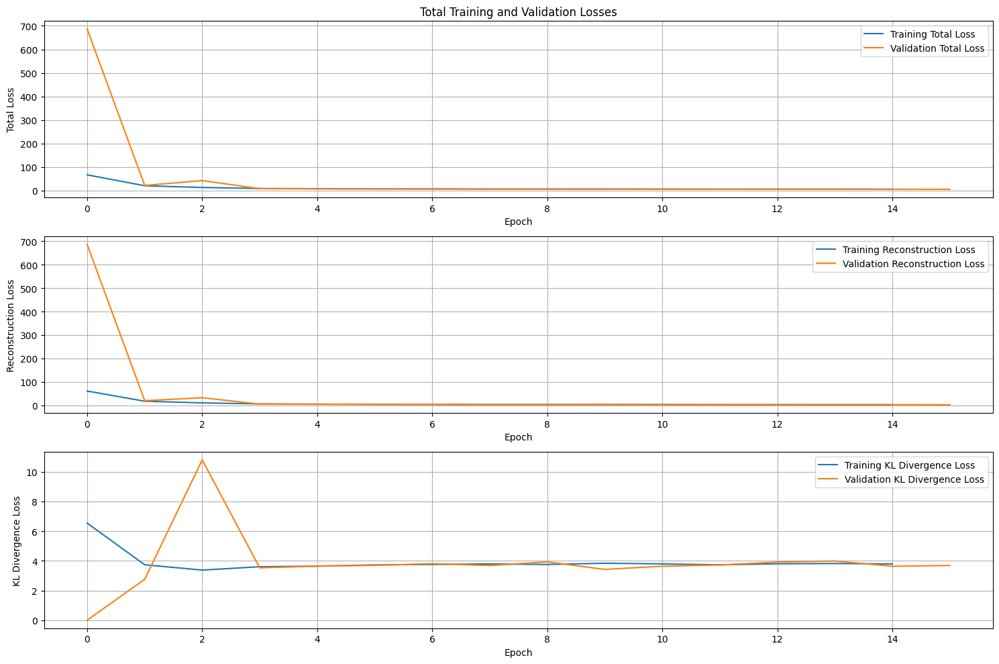

In [ ]:
if want_to_train:
    add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics=trainer.callback_metrics)
    torch.save(model.state_dict(), model_save_path)
    loss_history.plot_all_losses(save_path=model_losses_path)
else:
    model.load_state_dict(torch.load(model_save_path, weights_only=True))  

# Latent Space

## Dataset

In [33]:
if params['model_name']=='vae_inception_time':
    latent_means, latent_log_vars, _ = model.encode(scaled_data)
else:
    latent_means, latent_log_vars = model.encode(scaled_data)

latent_means = latent_means.detach().numpy()
latent_log_vars = latent_log_vars.detach().numpy()
latent_representation = np.concatenate((latent_means, latent_log_vars), axis=1)
np.save(latent_representations_path, latent_representation)
latent_representation.shape

(33786, 4)

In [34]:
latent_log_vars = torch.from_numpy(latent_log_vars)
latent_stdevs = torch.exp(0.5 * latent_log_vars)
latent_stdevs = latent_stdevs.numpy()
latent_stdevs.shape

(33786, 2)

In [35]:
features.shape

(33786, 3)

Saved plot to ../experiments/experiment_23/images/exp23_latent_space


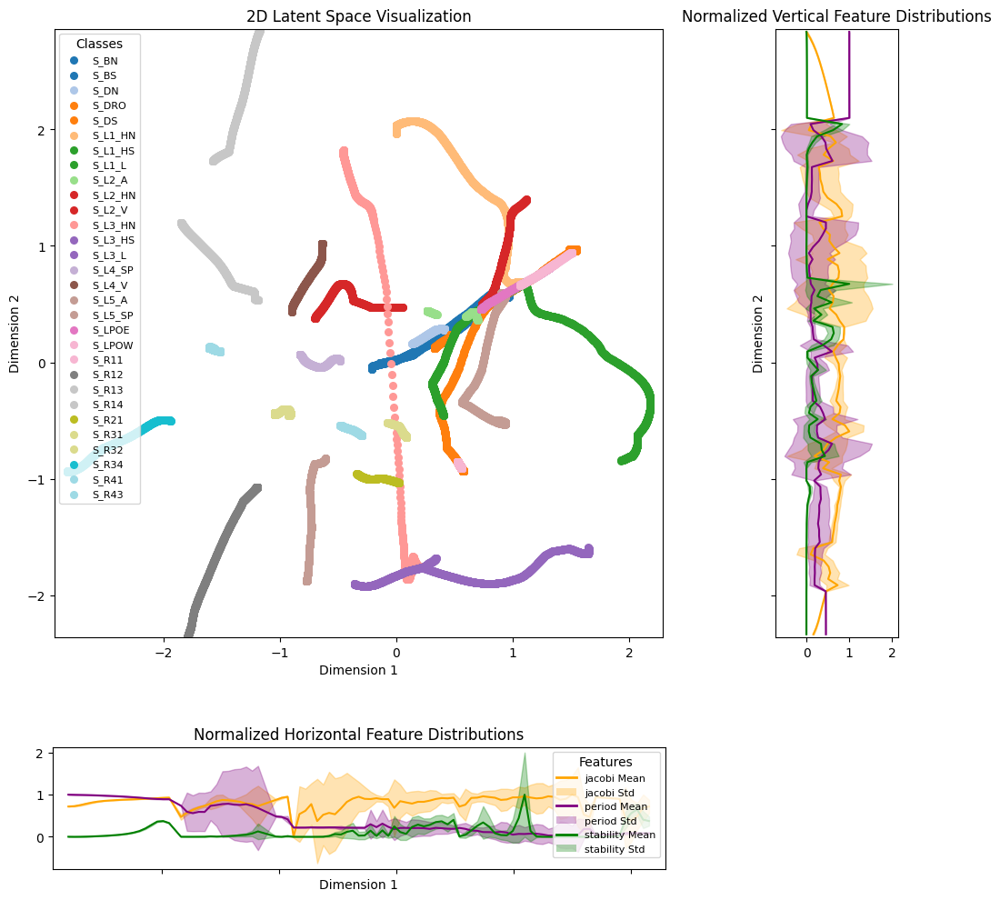

In [53]:
if latent_means.shape[1]==2:
    plot_2d_latent_space(latent_means,
                            np.array(family_labels),
                            save_path=latent_space_path,
                            features=features,
                            feature_names=feature_names,
                            plot_std=True)
else:
    rls=reduce_dimensions_latent_space(latent_means,
                                        np.array(family_labels),
                                        techniques=['PCA','UMAP','t-SNE'],
                                        save_path=latent_space_path,
                                        show_legend=False,
                                        latent_stdevs=latent_stdevs)

### Full Dataset

In [37]:
# Scale full data
full_scaled_data = scaler.transform(torch.tensor(full_data, dtype=torch.float32))

# Encode full data
if params['model_name']=='vae_inception_time':
    full_latent_means, full_latent_log_vars, _ = model.encode(full_scaled_data)
else:
    full_latent_means, full_latent_log_vars= model.encode(full_scaled_data)

full_latent_means = full_latent_means.detach().numpy()

# Calculate stdevs
full_latent_stdevs = torch.exp(0.5 * full_latent_log_vars)
full_latent_stdevs = full_latent_stdevs.detach().numpy()
full_latent_stdevs.shape

(45211, 2)

In [38]:
full_family_labels=get_orbit_classes(full_orbits_id_classes)[0]
family_labels_discarded_train = [label if label in discarded_families else 'training' for label in full_family_labels]
family_labels_discarded_train = np.array(family_labels_discarded_train)
family_labels_discarded_train.shape

(45211,)

In [39]:
full_features=full_orbit_df[feature_names].to_numpy()
full_features.shape

(45211, 3)

Saved plot to ../experiments/experiment_23/images/exp23_full_latent_space


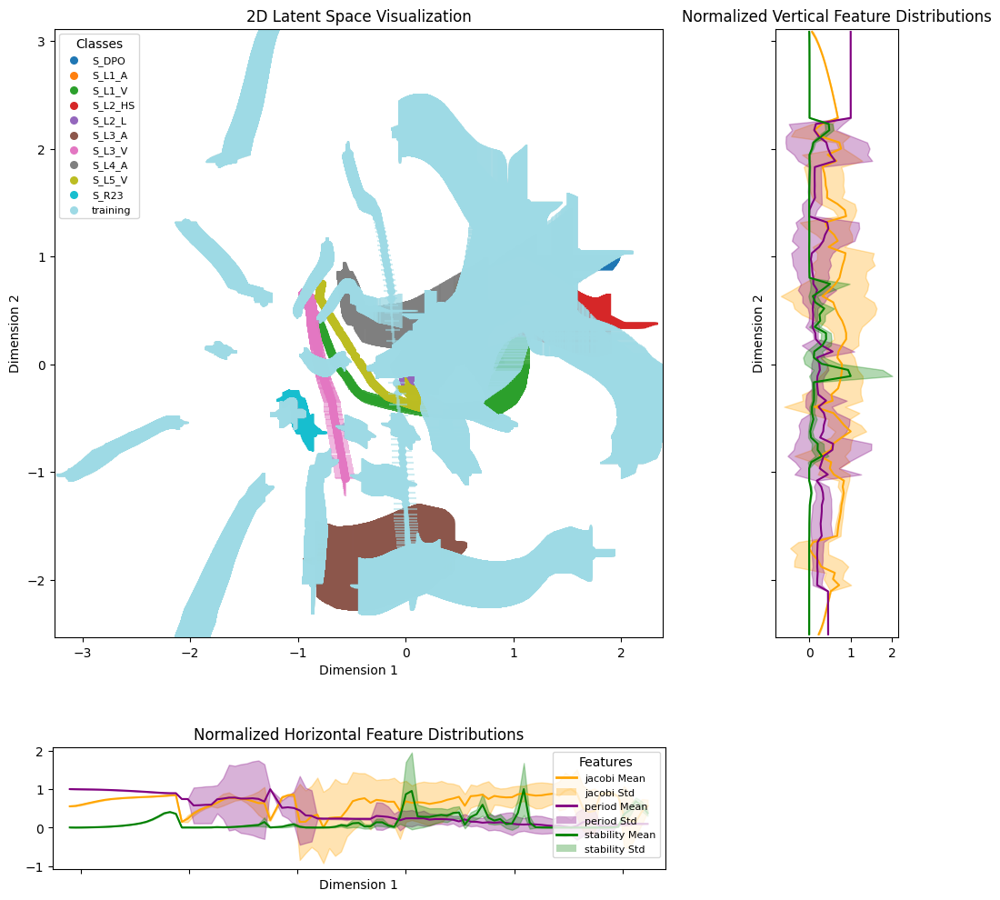

In [40]:
if full_latent_means.shape[1]==2:
    plot_2d_latent_space(full_latent_means,
                            family_labels_discarded_train,
                            save_path=full_latent_space_path,
                            features=full_features,
                            feature_names=feature_names,
                            plot_std=True,
                            latent_stdevs=full_latent_stdevs)

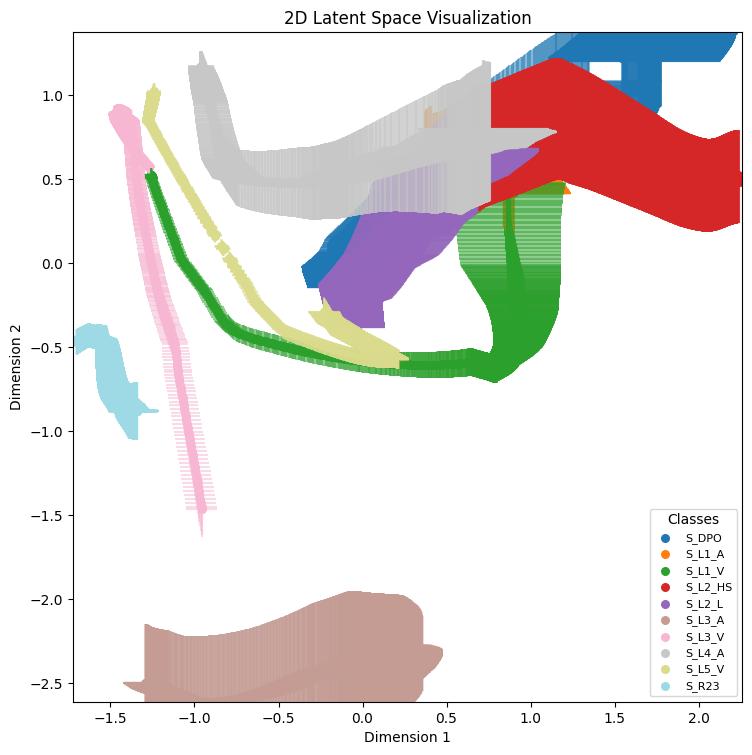

In [41]:
discarded_orbit_indices = [i for i in range(len(family_labels_discarded_train)) if family_labels_discarded_train[i] != 'training']

if full_latent_means.shape[1]==2:
    plot_2d_latent_space(full_latent_means[discarded_orbit_indices],
                            family_labels_discarded_train[discarded_orbit_indices],
                            save_path=discarded_latent_space_path,
                            features=full_features[discarded_orbit_indices],
                            latent_stdevs=full_latent_stdevs[discarded_orbit_indices])


## Centroids

In [42]:
# Compute centroids
centroid_means = compute_centroids(latent_means, orbits_id_classes, method='mean')
centroid_log_vars = compute_centroids(latent_log_vars, orbits_id_classes, method='mean')
centroids_representation = np.concatenate((centroid_means, centroid_log_vars), axis=1)
np.save(family_centroids_path, centroids_representation)
centroid_log_vars = torch.from_numpy(centroid_log_vars)
centroid_stdevs = torch.exp(0.5 * centroid_log_vars)
centroid_stdevs = centroid_stdevs.numpy()
centroid_stdevs.shape

(30, 2)

In [43]:
# Compute centroid labels
unique_classes = remove_duplicates_preserve_order(orbits_id_classes)
family_names=get_orbit_classes(unique_classes)[0]
len(family_names)

30

In [44]:
# Compute full data centroid
full_data_centroid = np.mean(latent_means, axis=0)
full_data_centroid

array([ 0.08288407, -0.0123785 ], dtype=float32)

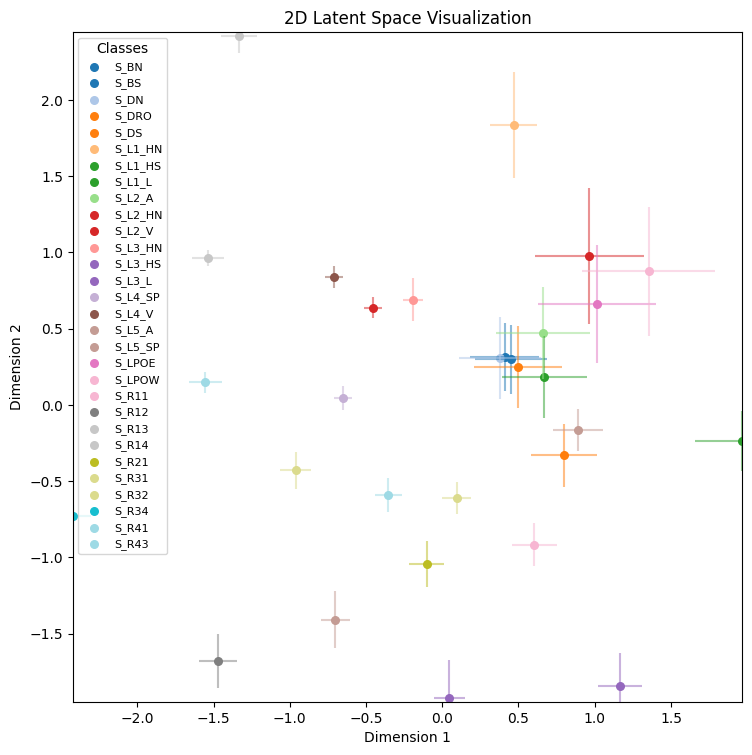

In [45]:
if latent_means.shape[1]==2:
    plot_2d_latent_space(centroid_means,
                            np.array(family_names),
                            save_path=family_centroids_plot_path,
                            latent_stdevs=centroid_stdevs
                            )
else:
    rls=reduce_dimensions_latent_space(centroid_means,
                                        np.array(family_names),
                                        techniques=['PCA','UMAP','t-SNE'],
                                        save_path=family_centroids_plot_path,
                                        show_legend=False)

### Full Centroids

In [46]:
# Compute centroids
full_centroid_means = compute_centroids(full_latent_means, full_orbits_id_classes, method='mean')
full_centroid_log_vars = compute_centroids(full_latent_log_vars.detach().numpy(), full_orbits_id_classes, method='mean')
full_centroid_stdevs = compute_centroids(full_latent_stdevs, full_orbits_id_classes, method='mean')
full_centroid_stdevs.shape

(40, 2)

In [47]:
# Calculate full centroid labels
full_unique_classes = remove_duplicates_preserve_order(full_orbits_id_classes)
full_family_names=get_orbit_classes(full_unique_classes)[0]
len(full_family_names)

40

In [48]:
families_discarded_train = [label if label in discarded_families else 'training' for label in full_family_names]
families_discarded_train = np.array(families_discarded_train)
len(families_discarded_train)

40

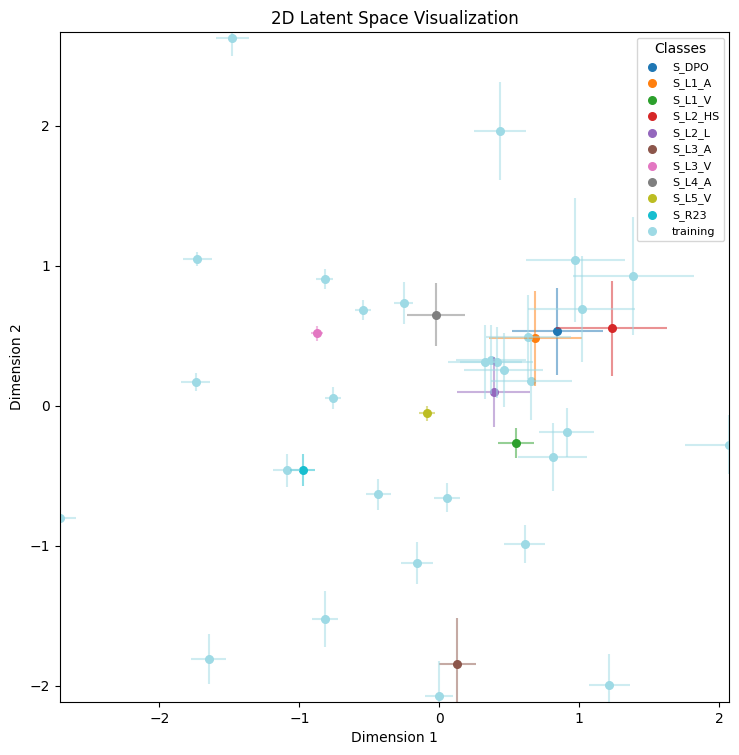

In [49]:
if full_centroid_means.shape[1]==2:
    plot_2d_latent_space(full_centroid_means,
                            families_discarded_train,
                            save_path=full_family_centroids_plot_path,
                            latent_stdevs=full_centroid_stdevs
                            )

In [50]:
discarded_family_indices = [i for i in range(len(families_discarded_train)) if families_discarded_train[i] != 'training']
discarded_centroid_means = full_centroid_means[discarded_family_indices]
discarded_centroid_log_vars = full_centroid_log_vars[discarded_family_indices]
discarded_centroid_log_vars.shape

(10, 2)

## Clustering

In [ ]:
if want_to_get_cluster_metrics:
    cluster_metrics = evaluate_clustering_multiple_labels(latent_means, [family_labels], label_names=['family'], clustering_method='gmm')
    add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics=cluster_metrics)

Metrics added to experiment with ID 23 in ../experiments/experiments.json.


# Generation

Normal Sampling

In [54]:
if want_to_generate:
    random_generation = model.sample(params['samples_to_generate'])
    random_generation = scaler.inverse_transform(random_generation)
    print(random_generation.shape)

torch.Size([100, 7, 100])


Discarded Centroid Sampling

In [55]:
if want_to_generate:
    discarded_centroids_latent_samples = sample_random_distributions(discarded_centroid_means, discarded_centroid_log_vars, params['samples_to_generate'])
    discarded_centroids_generation = model.decode(discarded_centroids_latent_samples)
    discarded_centroids_generation = scaler.inverse_transform(discarded_centroids_generation)
    print(discarded_centroids_generation.shape)

torch.Size([100, 7, 100])


Grid Sampling

In [61]:
if want_to_generate:
    grid_samples = grid_sample(centroid_means, grid_size=(10,10))
    grid_generation = model.decode(torch.from_numpy(grid_samples))
    grid_generation = scaler.inverse_transform(grid_generation)
    print(grid_generation.shape)

torch.Size([100, 7, 100])


Save or Load

In [62]:
if want_to_generate:
    generation = torch.cat([random_generation, discarded_centroids_generation, grid_generation], dim=0)
    generation = generation.detach().cpu().numpy()
    np.save(generated_data_path, random_generation.detach().numpy())
else:
    generation = np.load(generated_data_path)

## Visualization

In [63]:
if torch.is_tensor(generation):
    generation=generation.detach().numpy()

if generation.shape[1] == 7:
    no_time_generation = generation[:,1:,:]
    generation.shape
else:
    no_time_generation = generation

no_time_generation.shape

(300, 6, 100)

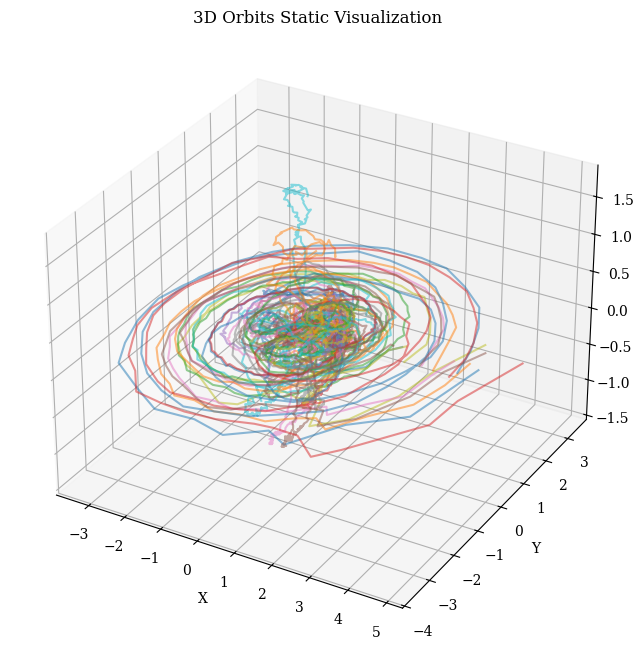

In [64]:
visualize_static_orbits(data= no_time_generation[0:100], show_legend=False, save_path=static_all_orbit_path)

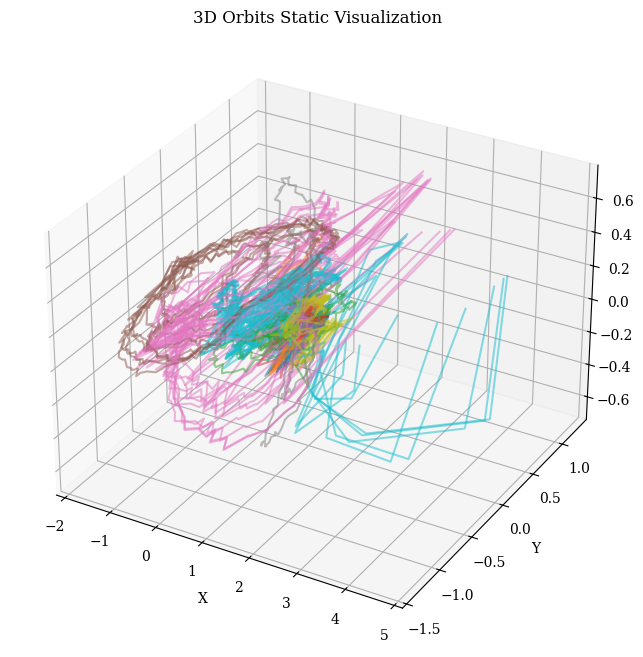

In [65]:
visualize_static_orbits(data= no_time_generation[100:200], show_legend=False)

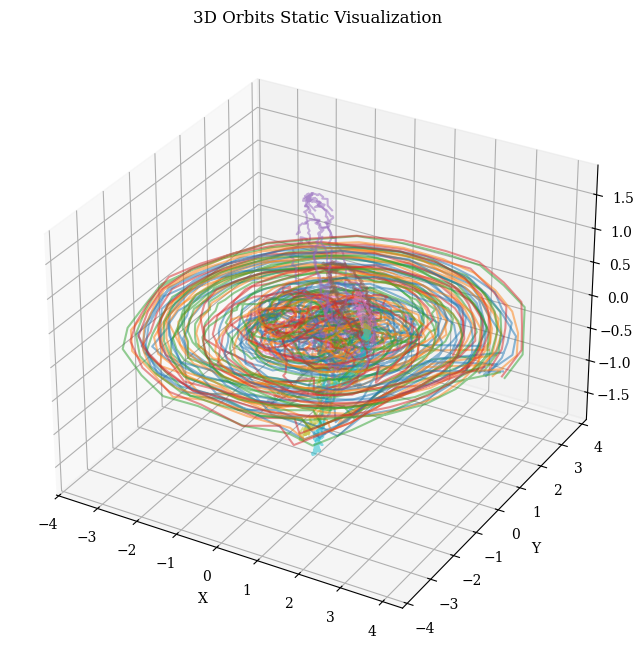

In [66]:
visualize_static_orbits(data= no_time_generation[200:300], show_legend=False)

In [67]:
export_dynamic_orbits_html(data=no_time_generation, filename=dynamic_orbits_path)

Visualization saved to ../experiments/experiment_23/images/exp23_generated_orbits.html


## Coverage

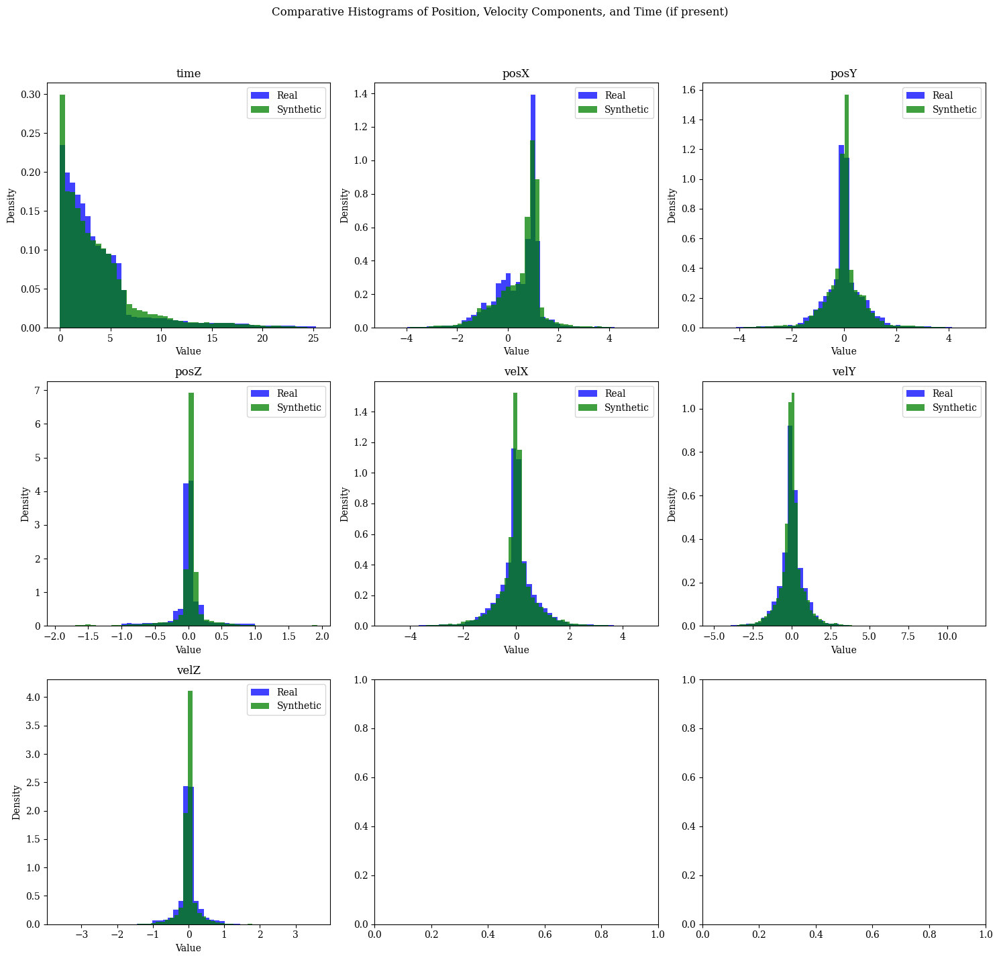

In [68]:
plot_histograms_comparison(data1=data, data2=generation, label1='Real', label2='Synthetic', normalize=True, save_path=histogram_comparison_path)

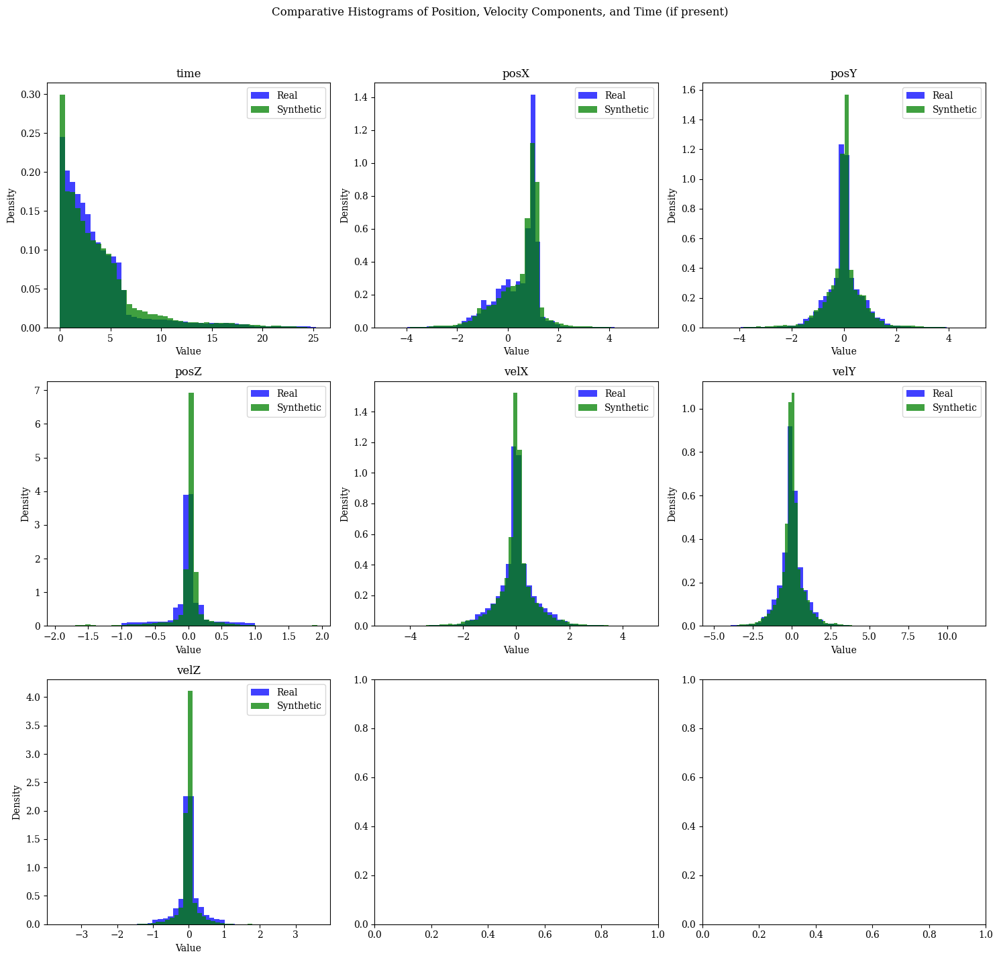

In [69]:
plot_histograms_comparison(data1=full_data, data2=generation, label1='Real', label2='Synthetic', normalize=True, save_path=full_histogram_comparison_path)

## Pheasibility

In [70]:
if calculate_error_metrics:

    #Order metrics
    reordered_generation, order_metrics_array, order_metric_labels = reorder_orbits(generation)
    average_order_metrics = order_metrics_array.mean(axis=0)
    average_order_metrics_dict = dict(zip(order_metric_labels, average_order_metrics))

    # Pheasibility metrics
    per_orbit_errors = calculate_errors_per_orbit(reordered_generation,EM_MU)
    mean_errors = {key: np.mean(value) for key, value in per_orbit_errors.items()}
    generation_df = pd.DataFrame(per_orbit_errors)
    new_values_df = pd.DataFrame(order_metrics_array, columns=order_metric_labels)
    generation_df = pd.concat([generation_df, new_values_df], axis=1)

    add_experiment_metrics(experiments_folder, experiment_id=experiment_id, metrics={**mean_errors, **average_order_metrics_dict})

else:
    generation_df = pd.read_csv(generation_df_path)



Metrics added to experiment with ID 23 in ../experiments/experiments.json.


In [71]:
generation_df.head()

,position_error,velocity_error,energy_error,disorder_metric,correct_order,inversions,kendall_tau_distance
0,0.204775,0.684061,4.716598,28.0,89.0,14.0,0.005689
1,0.122976,0.378417,10.013033,92.0,74.0,51.0,0.020694
2,0.155926,0.270953,9.231605,98.0,70.0,56.0,0.022695
3,0.044715,0.117407,0.083543,142.0,60.0,87.0,0.035351
4,0.064736,0.194818,0.124165,356.0,62.0,222.0,0.093183


# Convergence

In [152]:
# Interpolate similar time values to suceed in convergence
interpolated_generation = interpolate_equal_times(reordered_generation)
interpolated_generation.shape

(300, 7, 100)

In [155]:
if want_to_perform_convergence:
    refined_orbits, refined_orbits_df= process_diferential_correction_orbits(np.transpose(interpolated_generation,(0,2,1)),
                                                                        EM_MU,
                                                                        max_iter=params['max_iter_convergence'])
    refined_orbits = np.transpose(refined_orbits,(0,2,1))
    np.save(refined_data_path, refined_orbits)
else:
    refined_orbits = np.load(refined_data_path)
    refined_orbits_df = pd.read_csv(refined_orbits_df_path)

refined_orbits.shape

INFO:orbit_generation.convergence:Processing orbit 1/300
INFO:orbit_generation.convergence:Orbit 0: Success=-1, Norm=16.168793129896113, Iterations=2
INFO:orbit_generation.convergence:Processing orbit 2/300
INFO:orbit_generation.convergence:Orbit 1: Success=-1, Norm=22.596226879376918, Iterations=5
INFO:orbit_generation.convergence:Processing orbit 3/300
INFO:orbit_generation.convergence:Orbit 2: Success=1, Norm=1.7504868660008002e-11, Iterations=18
INFO:orbit_generation.convergence:Processing orbit 4/300
INFO:orbit_generation.convergence:Orbit 3: Success=-1, Norm=15.05804133091296, Iterations=15
INFO:orbit_generation.convergence:Processing orbit 5/300
INFO:orbit_generation.convergence:Orbit 4: Success=-1, Norm=3.484194570888213, Iterations=20
INFO:orbit_generation.convergence:Processing orbit 6/300
INFO:orbit_generation.convergence:Orbit 5: Success=-1, Norm=14.122305923751805, Iterations=3
INFO:orbit_generation.convergence:Processing orbit 7/300
INFO:orbit_generation.convergence:Orbit

(96, 7, 100)

Order Metrics

In [156]:
# Order orbits and average metrics
reordered_refined_orbits, refined_order_metrics_array, refined_order_metric_labels = reorder_orbits(refined_orbits)
refined_average_order_metrics = refined_order_metrics_array.mean(axis=0)
refined_order_metrics = dict(zip(refined_order_metric_labels, refined_average_order_metrics))

# Add individual metrics to the df
new_values_df = pd.DataFrame(refined_order_metrics_array, columns=refined_order_metric_labels)
refined_orbits_df = pd.concat([refined_orbits_df, new_values_df], axis=1)

refined_order_metrics

{'disorder_metric': np.float64(220.4375),
 'correct_order': np.float64(71.39583333333333),
 'inversions': np.float64(146.08333333333334),
 'kendall_tau_distance': np.float64(0.059023569023568895)}

Pheasibility Metrics

In [157]:
refined_per_orbit_errors = calculate_errors_per_orbit(reordered_refined_orbits,EM_MU)
refined_orbits_df['propagated_position_error'] = refined_per_orbit_errors['position_error']
refined_orbits_df['propagated_velocity_error'] = refined_per_orbit_errors['velocity_error']
refined_orbits_df['propagated_energy_error'] = refined_per_orbit_errors['energy_error']
refined_mean_errors = {key: np.mean(value) for key, value in refined_per_orbit_errors.items()}
refined_mean_errors

{'position_error': np.float64(5.8157426690128655e-12),
 'velocity_error': np.float64(1.1516520643259277e-11),
 'energy_error': np.float64(2.2376562186603636e-11)}

In [231]:
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance,closest_family_full_centroid,closest_family_full_centroid_distance,family_of_feature_closest_orbit,family_of_closest_orbit
0,2,6.015932,6.269739,18,1.750487e-11,0.195696,0.108707,0.055770,-0.015940,3.947103,0.016973,0.198585,-0.025991,-6.383230e-17,0.159060,2.671047,3.269417e-15,94.0,70.0,55.0,0.022222,1.604667e-12,5.158039e-12,5.008831e-11,0.085387,2.227825,0.253808,34685,0.000116,5092,2.712217,4.399190,0.967011,0.999224,20,0.087295,29,0.181905,1.296339,29,0.099303,32.0,5.0
1,7,3.329923,3.397226,11,1.291115e-12,0.969681,0.001888,0.021506,0.015409,0.093883,-0.068099,1.129500,-0.009888,-1.261622e-15,-0.002363,0.131290,2.538893e-14,276.0,62.0,181.0,0.073131,1.339571e-12,2.484736e-12,3.730349e-14,0.129475,3.172267,0.067303,17970,0.000453,17973,0.371865,1.371663,0.885134,3.931877,8,0.149518,6,0.643249,0.180267,3,0.062636,15.0,15.0
2,10,9.795383,12.389617,13,2.733556e-13,0.965878,-0.249973,0.009874,0.038999,0.776029,0.031629,0.569196,-1.143545,-9.557926e-15,-0.418359,0.080683,4.791488e-15,134.0,80.0,81.0,0.032727,2.210193e-12,2.367034e-12,1.208461e-14,0.093221,3.022210,2.594233,41632,0.045814,35706,9.442332,7.666517,1.609862,5.173377,17,0.628318,36,0.304440,1.284370,36,0.626888,39.0,33.0
3,11,5.305003,4.422004,8,6.161111e-11,1.023620,-0.055717,0.121162,-0.020475,-0.204854,0.312339,1.075758,-0.053617,1.375716e-01,-0.173918,-0.076805,3.127483e-01,144.0,69.0,88.0,0.035556,1.474056e-12,4.133549e-12,8.130946e-12,0.257042,2.979148,0.882999,12841,0.000002,12808,1.396974,2.009221,0.727293,2.889137,8,0.087361,11,0.062763,0.207204,11,0.088225,12.0,12.0
4,12,11.299368,12.494985,11,1.320579e-10,0.491438,-0.165805,0.053263,-0.333114,2.562464,0.055236,0.283720,-0.165281,1.053249e-11,0.388326,1.929158,8.115873e-11,98.0,73.0,54.0,0.021818,3.191574e-12,6.781526e-12,9.680663e-11,0.221489,2.110607,1.195617,35041,0.000371,35030,5.513189,5.589581,2.591882,5.249877,21,0.392354,30,0.820260,0.985184,30,0.379495,33.0,33.0


In [159]:
refined_ids = refined_orbits_df['id'].astype(int).tolist()
generated_data_that_was_refined = generation[refined_ids]
generated_data_that_was_refined.shape

(96, 7, 100)

## Visualization

Refinement by Samplings

In [221]:
index_100 = refined_orbits_df[refined_orbits_df['id'] >= 100].index[0] if not refined_orbits_df[refined_orbits_df['id'] >= 100].empty else None
index_200 = refined_orbits_df[refined_orbits_df['id'] >= 200].index[0] if not refined_orbits_df[refined_orbits_df['id'] >= 200].empty else None

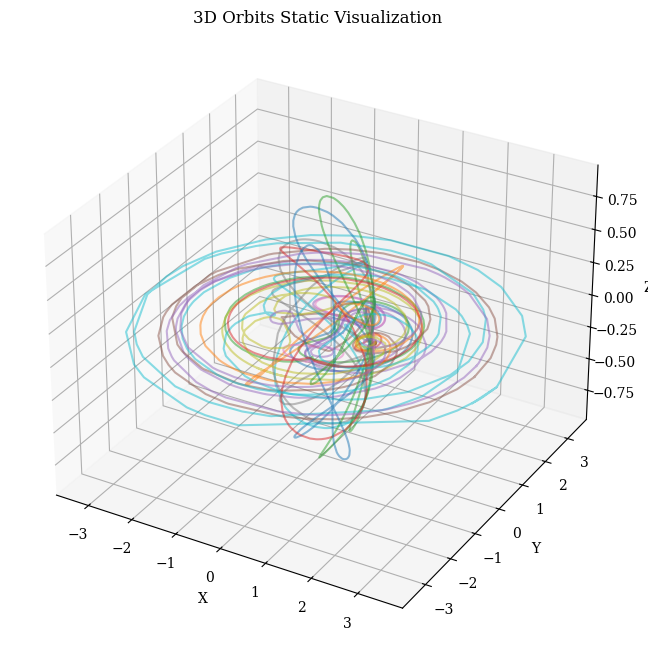

In [222]:
visualize_static_orbits(reordered_refined_orbits[:index_100,1:,:], show_legend=False)

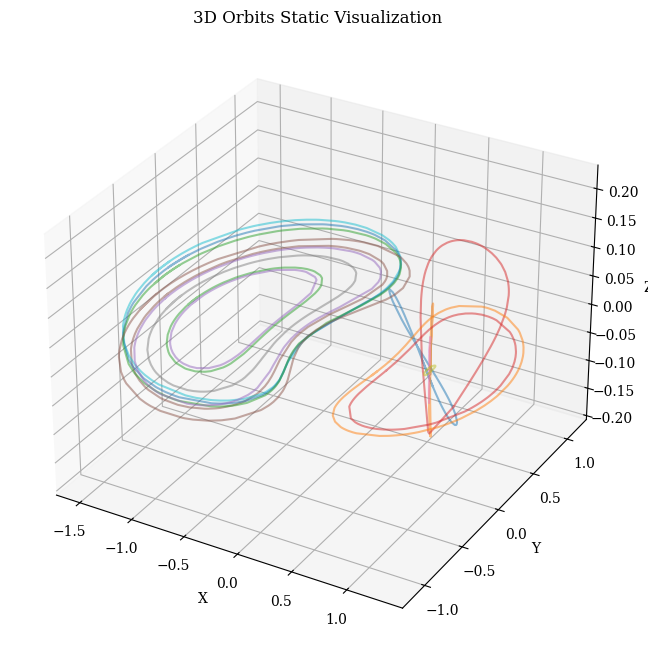

In [223]:
visualize_static_orbits(reordered_refined_orbits[index_100:index_200,1:,:], show_legend=False)

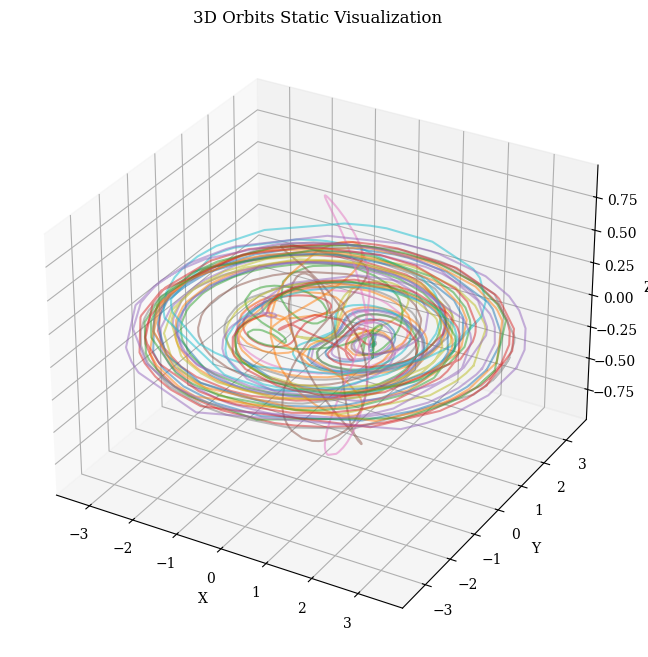

In [224]:
visualize_static_orbits(reordered_refined_orbits[index_200:,1:,:], show_legend=False)

Generation that was able to get Refined

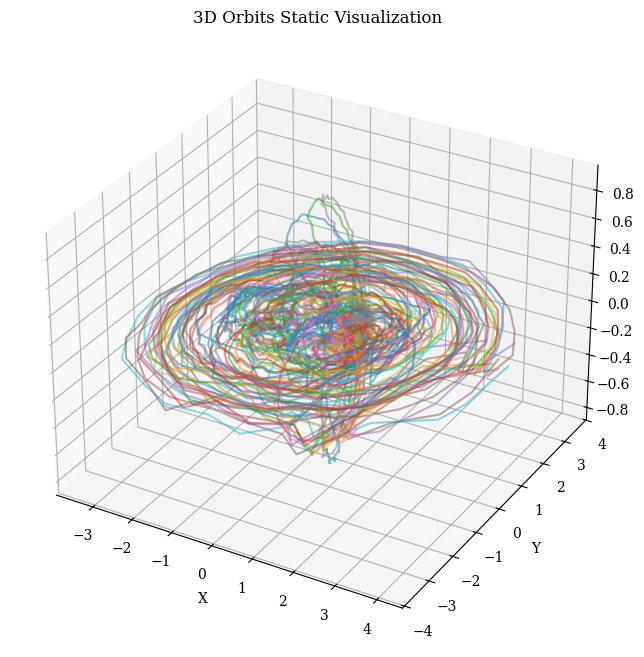

In [160]:
visualize_static_orbits(generated_data_that_was_refined[:,1:,:], show_legend=False, save_path=generated_orbits_that_converged_path)

Refinement

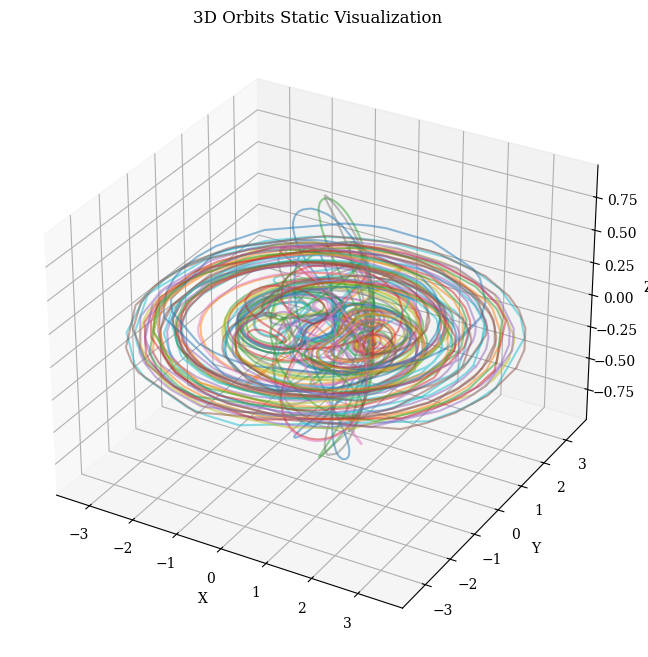

In [161]:
visualize_static_orbits(reordered_refined_orbits[:,1:,:], show_legend=False, save_path=refined_orbits_path)

Generation that didn't manage to get refined

In [ ]:
non_refined_ids = sorted(set(range(3*params['samples_to_generate'])) - set(refined_ids))
generated_data_that_was_not_refined = generation[non_refined_ids]
generated_data_that_was_not_refined.shape

(55, 7, 100)

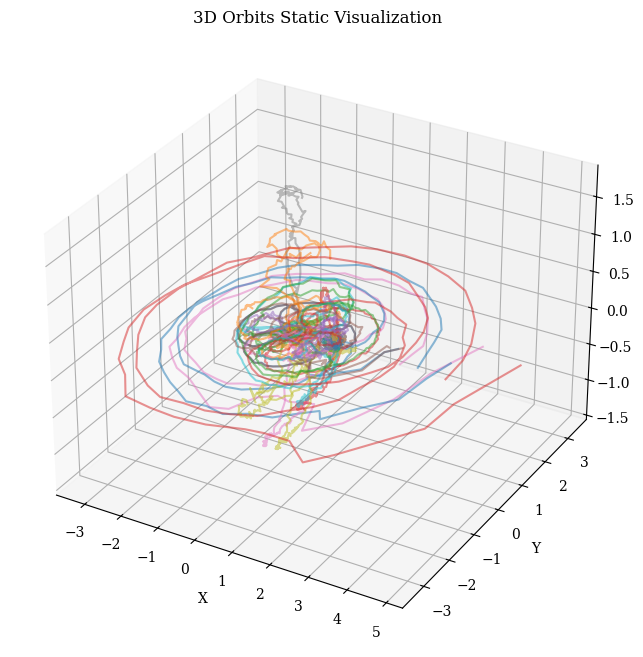

In [ ]:
visualize_static_orbits(generated_data_that_was_not_refined[:,1:,:], show_legend=False, save_path=generated_orbits_that_did_not_converged_path)

## Latent Space

In [164]:
refined_scaled_data = scaler.transform(torch.from_numpy(refined_orbits).float())
refined_latent_means, refined_latent_log_vars = model.encode(refined_scaled_data)
refined_latent_means = refined_latent_means.detach().numpy()
refined_latent_log_vars = refined_latent_log_vars.detach().numpy()
refined_latent_representations = np.concatenate((refined_latent_means, refined_latent_log_vars), axis=1)
refined_latent_representations.shape

(96, 4)

Saved plot to ../experiments/experiment_23/images/exp23_combined_latent_space


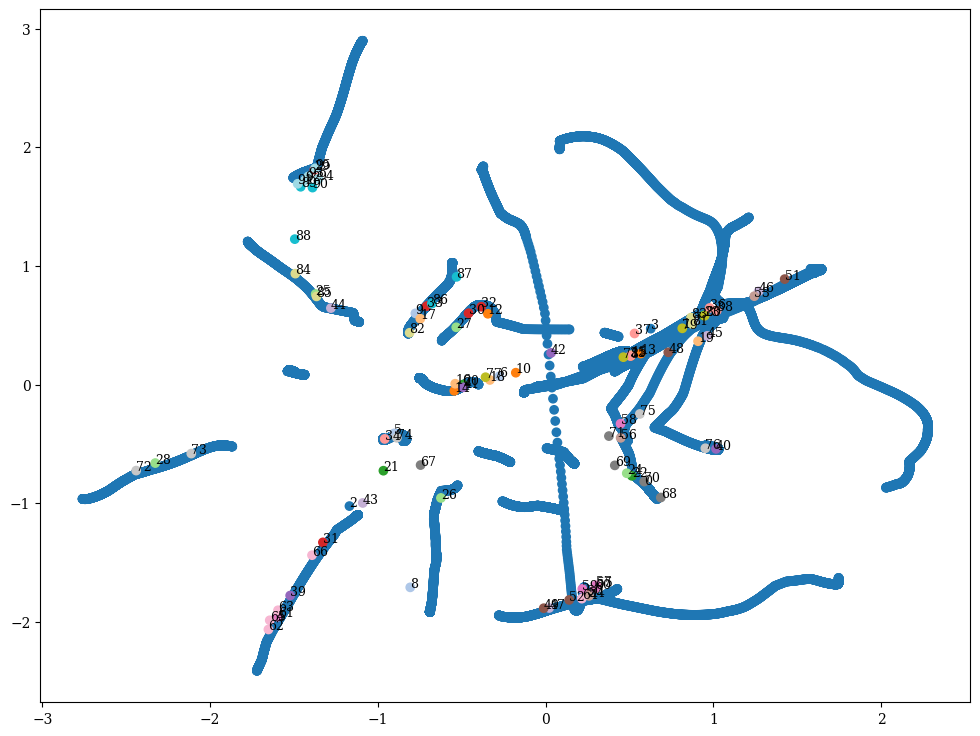

In [165]:
if refined_latent_means.shape[1]>2:
    rls=reduce_dimensions_latent_space(train_latent=latent_representation,
                                        val_latent=refined_latent_means)
    latent_representation=rls['PCA']['train']
    refined_latent_means=rls['PCA']['val']

plot_combined_2d_latent_space(
    real_latent=latent_means, 
    synthetic_latent=refined_latent_means,
    synthetic_labels=list(range(0, len(refined_scaled_data))),
    annotation_mode='numbers',
    save_path=combined_latent_space_path
)

In [166]:
scaled_generation = scaler.transform(torch.from_numpy(generation).float())
latent_generation_means, _ = model.encode(scaled_generation)
latent_generation_means = latent_generation_means.detach().numpy()
latent_generation_means_that_refined = latent_generation_means[refined_ids]
generation_to_refinement = np.stack((latent_generation_means_that_refined, refined_latent_means), axis=1)
generation_to_refinement.shape

(96, 2, 2)

Saved plot to ../experiments/experiment_23/images/exp23_combined_latent_space_arrows


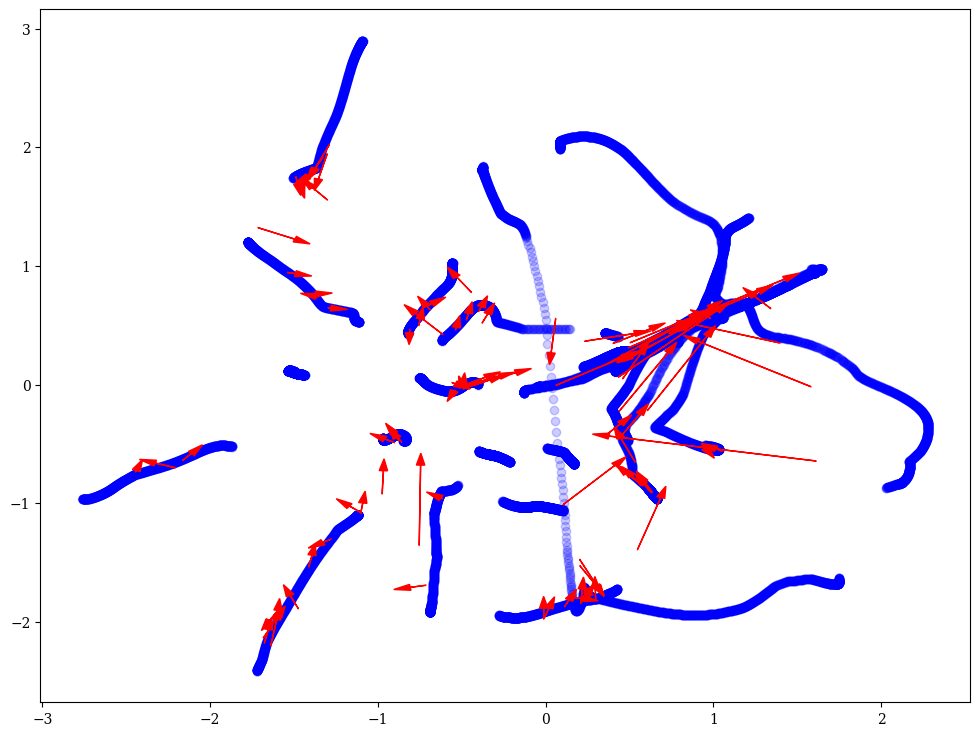

In [167]:
plot_combined_2d_latent_space(
    real_latent=latent_means, 
    synthetic_latent=generation_to_refinement,
    annotation_mode='numbers',
    save_path=combined_latent_space_arrows_path
)

In [168]:
generation_to_refinement_latent_distance = calculate_pairwise_distances(latent_generation_means_that_refined, refined_latent_means, distance_metric=params['distance_metric'])
refined_orbits_df['latent_distance_to_generation'] = generation_to_refinement_latent_distance

## Features

Calculate Jacobi Constant on the dataset

In [169]:
results = np.array([jacobi_constant(np.transpose(full_data[:,1:,:],(0,2,1))[i][0], EM_MU)[0] for i in range(full_data.shape[0])])
full_orbit_df['calculated_jacobi'] = results

full_orbit_df.head()

,id_class,x_0,y_0,x_0,vx_0,vy_0,vz_0,jacobi,period,stability,propagated_periods,calculated_jacobi
0,1.0,0.941000,1.900442e-23,0.509474,2.968938e-13,-0.124968,-3.122717e-12,2.745412,11.555291,211.184678,3.0,2.757415
1,1.0,0.941538,-8.592698e-24,0.508602,2.902340e-13,-0.125672,-3.252212e-12,2.746226,11.551622,210.329145,3.0,2.758229
2,1.0,0.942076,6.956604e-24,0.507729,2.685527e-13,-0.126375,-2.862050e-12,2.747039,11.547936,209.473685,3.0,2.759042
3,1.0,0.942613,1.763946e-24,0.506856,3.153637e-13,-0.127078,-3.791054e-12,2.747850,11.544233,208.618315,3.0,2.759853
4,1.0,0.943150,9.441804e-24,0.505982,2.663322e-13,-0.127781,-2.982720e-12,2.748660,11.540511,207.763051,3.0,2.760663


Calculate Jacobi Constant and Period on the Refined Orbits

In [170]:
new_jacobis = np.array([jacobi_constant(np.transpose(refined_orbits[:,1:,:],(0,2,1))[i][0], EM_MU)[0] for i in range(refined_orbits.shape[0])])
refined_orbits_df['calculated_jacobi'] = new_jacobis
refined_orbits_df.rename(columns={'new_period': 'period'}, inplace=True)
refined_orbits_df['period_distance_with_generation'] = abs(refined_orbits_df['period'] - refined_orbits_df['old_period'])
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation
0,2,6.015932,6.269739,18,1.750487e-11,0.195696,0.108707,0.055770,-0.015940,3.947103,0.016973,0.198585,-0.025991,-6.383230e-17,0.159060,2.671047,3.269417e-15,94.0,70.0,55.0,0.022222,1.604667e-12,5.158039e-12,5.008831e-11,0.085387,2.227825,0.253808
1,7,3.329923,3.397226,11,1.291115e-12,0.969681,0.001888,0.021506,0.015409,0.093883,-0.068099,1.129500,-0.009888,-1.261622e-15,-0.002363,0.131290,2.538893e-14,276.0,62.0,181.0,0.073131,1.339571e-12,2.484736e-12,3.730349e-14,0.129475,3.172267,0.067303
2,10,9.795383,12.389617,13,2.733556e-13,0.965878,-0.249973,0.009874,0.038999,0.776029,0.031629,0.569196,-1.143545,-9.557926e-15,-0.418359,0.080683,4.791488e-15,134.0,80.0,81.0,0.032727,2.210193e-12,2.367034e-12,1.208461e-14,0.093221,3.022210,2.594233
3,11,5.305003,4.422004,8,6.161111e-11,1.023620,-0.055717,0.121162,-0.020475,-0.204854,0.312339,1.075758,-0.053617,1.375716e-01,-0.173918,-0.076805,3.127483e-01,144.0,69.0,88.0,0.035556,1.474056e-12,4.133549e-12,8.130946e-12,0.257042,2.979148,0.882999
4,12,11.299368,12.494985,11,1.320579e-10,0.491438,-0.165805,0.053263,-0.333114,2.562464,0.055236,0.283720,-0.165281,1.053249e-11,0.388326,1.929158,8.115873e-11,98.0,73.0,54.0,0.021818,3.191574e-12,6.781526e-12,9.680663e-11,0.221489,2.110607,1.195617


Compare Features between Dataset and Refinement

Saved plot to ../experiments/experiment_23/images/exp23_features


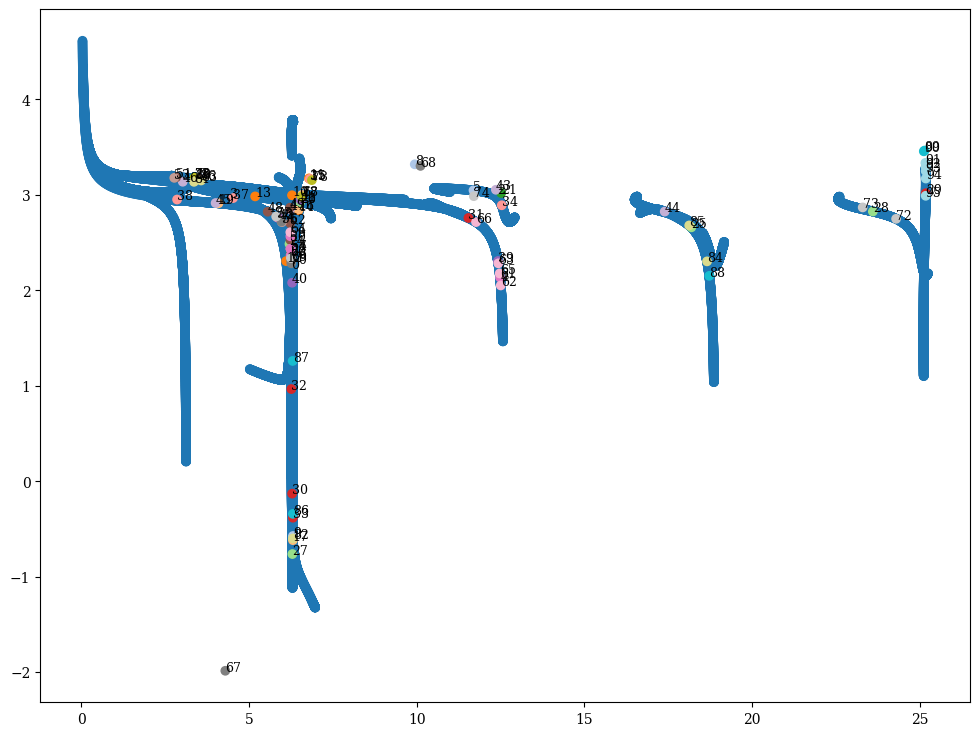

In [171]:
features_used = ['period', 'calculated_jacobi']

dataset_features = full_orbit_df[features_used].values
refined_orbits_features = refined_orbits_df[features_used].values 

closest_feature_indices, feature_distances = find_nearest_points_batch(refined_orbits_features, dataset_features,
                                                                       n=1, distance_metric=params['distance_metric'])

refined_orbits_df['feature_closest_orbit'] = closest_feature_indices
refined_orbits_df['feature_distance_from_closest_orbit'] = feature_distances

plot_combined_2d_latent_space(dataset_features, refined_orbits_features,
                              synthetic_labels=list(range(0, len(refined_scaled_data))),
                              annotation_mode='numbers', save_path=features_plot_path)

Feature Centroids

In [172]:
array_features = full_orbit_df[features_used].to_numpy()
feature_centroid = full_orbit_df[features_used].mean().to_numpy()
feature_centroids = compute_centroids(array_features, full_orbits_id_classes, method='mean')
feature_centroids.shape

(40, 2)

In [173]:
stdev_feature_centroids  = full_orbit_df.groupby('id_class')[features_used].std().values
stdev_feature_centroids.shape

(40, 2)

In [174]:
feature_centroid = full_orbit_df[features_used].mean().values
feature_centroid.shape

(2,)

In [175]:
full_unique_classes = list(set(full_orbits_id_classes))
full_family_names=get_orbit_classes(full_unique_classes)[0]
len(full_family_names)

40

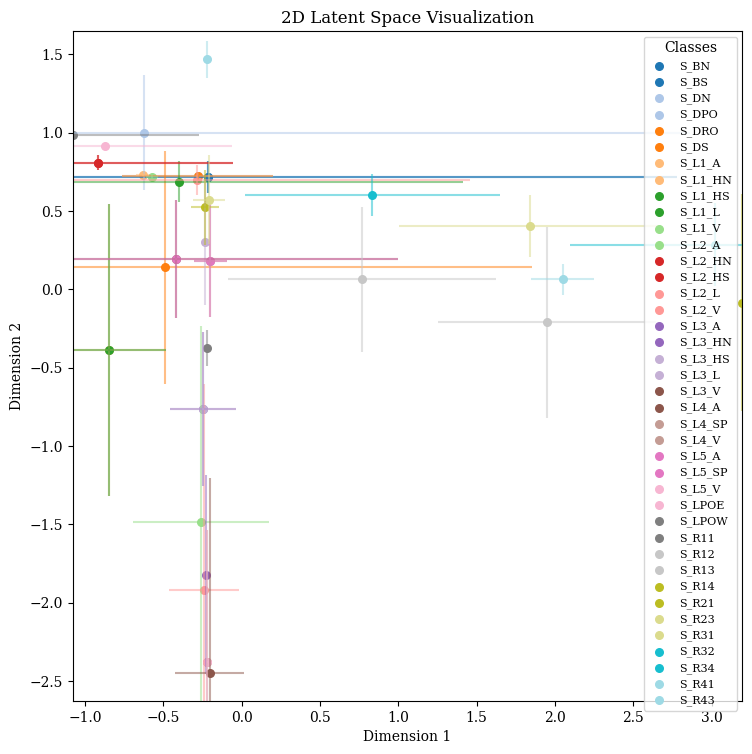

In [176]:
if len(features_used)==2:
    plot_2d_latent_space(feature_centroids,np.array(full_family_names), latent_stdevs=stdev_feature_centroids, save_path=family_feature_centroids_plot_path)

## Calculate distances

In [177]:
if data.shape[1] == 7:
    no_time_data = full_data[:,1:,:]
    no_time_refined_orbits = refined_orbits[:,1:,:]
    no_time_generated_data_that_was_refined = generated_data_that_was_refined[:,1:,:]
else:
    no_time_data = full_data
    no_time_refined_orbits = refined_orbits
    no_time_generated_data_that_was_refined = generated_data_that_was_refined

print(no_time_data.shape)
print(no_time_refined_orbits.shape)
print(no_time_generated_data_that_was_refined.shape)
print(no_time_generation.shape)


(45211, 6, 100)
(96, 6, 100)
(96, 6, 100)
(300, 6, 100)


### Orbit Distances

1. Nearest Orbit

In [178]:
nearest_indices_generation, nearest_distances_generation = find_nearest_orbits_batch(no_time_generation,
                                                                                     no_time_data,
                                                                                     n=1,
                                                                                     distance_metric=params['distance_metric'])
generation_df['nearest_orbit'] = nearest_indices_generation
generation_df['nearest_orbit_distance'] = nearest_distances_generation

In [179]:
nearest_indices_refined_generation, nearest_distances_refined_generation = find_nearest_orbits_batch(no_time_refined_orbits,
                                                                                                     no_time_data,
                                                                                                     n=1,
                                                                                                     distance_metric=params['distance_metric'])
refined_orbits_df['nearest_orbit'] = nearest_indices_refined_generation
refined_orbits_df['nearest_orbit_distance'] = nearest_distances_refined_generation

2. Generation vs Refinement

In [180]:
pairwise_distances = calculate_pairwise_orbit_distances(no_time_generated_data_that_was_refined,
                                                        no_time_refined_orbits, distance_metric=params['distance_metric'])
refined_orbits_df['distance_from_generation'] = pairwise_distances

### Point Distances

3. Distance from the centre

In [181]:
# Latent space distance
centroid_distances = calculate_distances_batch(full_data_centroid, refined_latent_means, distance_metric=params['distance_metric'])
refined_orbits_df['centroid_distance'] = centroid_distances

In [182]:
# Feature distance
feature_centroid_distances = calculate_distances_batch(feature_centroid, refined_orbits_features, distance_metric=params['distance_metric'])
refined_orbits_df['feature_centroid_distance'] = feature_centroid_distances

4. Distance from centroids

In [183]:
# Latent Space Centroids
closest_family_centroid, closest_family_centroid_distance = find_nearest_points_batch(refined_latent_means, centroid_means, n=1, distance_metric=params['distance_metric'])
refined_orbits_df['closest_family_centroid'] = closest_family_centroid
refined_orbits_df['closest_family_centroid_distance'] = closest_family_centroid_distance

In [184]:
# Feature Space Centroids
closest_family_feature_centroid, closest_family_feature_centroid_distance = find_nearest_points_batch(refined_orbits_features, feature_centroids, n=1, distance_metric=params['distance_metric'])
refined_orbits_df['closest_family_feature_centroid'] = closest_family_feature_centroid
refined_orbits_df['closest_family_feature_centroid_distance'] = closest_family_feature_centroid_distance

5. Initial Conditions

In [185]:
# Extract initial and final conditions
initial_conditions = refined_orbits_df[['initial_pos_x0', 'initial_pos_y0', 'initial_pos_z0',
                        'initial_vel_x0', 'initial_vel_y0', 'initial_vel_z0']].values
final_conditions = refined_orbits_df[['final_pos_x0', 'final_pos_y0', 'final_pos_z0',
                      'final_vel_x0', 'final_vel_y0', 'final_vel_z0']].values

ics_distances = calculate_pairwise_distances(initial_conditions, final_conditions, distance_metric=params['distance_metric'])
refined_orbits_df['initial_conditions_distance'] = ics_distances

## Export Features

In [186]:
generation_df.to_csv(generation_df_path, index=False)
generation_df.shape

(300, 9)

In [187]:
generation_df.head()

,position_error,velocity_error,energy_error,disorder_metric,correct_order,inversions,kendall_tau_distance,nearest_orbit,nearest_orbit_distance
0,0.204775,0.684061,4.716598,28.0,89.0,14.0,0.005689,44578,3.980216
1,0.122976,0.378417,10.013033,92.0,74.0,51.0,0.020694,38120,3.424277
2,0.155926,0.270953,9.231605,98.0,70.0,56.0,0.022695,34154,1.361354
3,0.044715,0.117407,0.083543,142.0,60.0,87.0,0.035351,3028,2.670191
4,0.064736,0.194818,0.124165,356.0,62.0,222.0,0.093183,10413,1.944123


In [188]:
refined_orbits_df.to_csv(refined_orbits_df_path, index=False)
refined_orbits_df.shape

(96, 39)

In [189]:
refined_orbits_df.head()

,id,old_period,period,iterations_convergence,error,initial_pos_x0,initial_pos_y0,initial_pos_z0,initial_vel_x0,initial_vel_y0,initial_vel_z0,final_pos_x0,final_pos_y0,final_pos_z0,final_vel_x0,final_vel_y0,final_vel_z0,disorder_metric,correct_order,inversions,kendall_tau_distance,propagated_position_error,propagated_velocity_error,propagated_energy_error,latent_distance_to_generation,calculated_jacobi,period_distance_with_generation,feature_closest_orbit,feature_distance_from_closest_orbit,nearest_orbit,nearest_orbit_distance,distance_from_generation,centroid_distance,feature_centroid_distance,closest_family_centroid,closest_family_centroid_distance,closest_family_feature_centroid,closest_family_feature_centroid_distance,initial_conditions_distance
0,2,6.015932,6.269739,18,1.750487e-11,0.195696,0.108707,0.055770,-0.015940,3.947103,0.016973,0.198585,-0.025991,-6.383230e-17,0.159060,2.671047,3.269417e-15,94.0,70.0,55.0,0.022222,1.604667e-12,5.158039e-12,5.008831e-11,0.085387,2.227825,0.253808,34685,0.000116,5092,2.712217,4.399190,0.967011,0.999224,20,0.087295,29,0.181905,1.296339
1,7,3.329923,3.397226,11,1.291115e-12,0.969681,0.001888,0.021506,0.015409,0.093883,-0.068099,1.129500,-0.009888,-1.261622e-15,-0.002363,0.131290,2.538893e-14,276.0,62.0,181.0,0.073131,1.339571e-12,2.484736e-12,3.730349e-14,0.129475,3.172267,0.067303,17970,0.000453,17973,0.371865,1.371663,0.885134,3.931877,8,0.149518,6,0.643249,0.180267
2,10,9.795383,12.389617,13,2.733556e-13,0.965878,-0.249973,0.009874,0.038999,0.776029,0.031629,0.569196,-1.143545,-9.557926e-15,-0.418359,0.080683,4.791488e-15,134.0,80.0,81.0,0.032727,2.210193e-12,2.367034e-12,1.208461e-14,0.093221,3.022210,2.594233,41632,0.045814,35706,9.442332,7.666517,1.609862,5.173377,17,0.628318,36,0.304440,1.284370
3,11,5.305003,4.422004,8,6.161111e-11,1.023620,-0.055717,0.121162,-0.020475,-0.204854,0.312339,1.075758,-0.053617,1.375716e-01,-0.173918,-0.076805,3.127483e-01,144.0,69.0,88.0,0.035556,1.474056e-12,4.133549e-12,8.130946e-12,0.257042,2.979148,0.882999,12841,0.000002,12808,1.396974,2.009221,0.727293,2.889137,8,0.087361,11,0.062763,0.207204
4,12,11.299368,12.494985,11,1.320579e-10,0.491438,-0.165805,0.053263,-0.333114,2.562464,0.055236,0.283720,-0.165281,1.053249e-11,0.388326,1.929158,8.115873e-11,98.0,73.0,54.0,0.021818,3.191574e-12,6.781526e-12,9.680663e-11,0.221489,2.110607,1.195617,35041,0.000371,35030,5.513189,5.589581,2.591882,5.249877,21,0.392354,30,0.820260,0.985184


In [190]:
not_to_show_columns = ['initial_pos_x0','initial_pos_y0','initial_pos_z0',	'initial_vel_x0',	'initial_vel_y0',	'initial_vel_z0	final_pos_x0',	'final_pos_y0',	'final_pos_z0',	'final_vel_x0',	'final_vel_y0',	'final_vel_z0', 'inversions',	'kendall_tau_distance' , 'closest_feature_indices',	'nearest_orbit', 'closest_family_centroid', 'closest_family_feature_centroid']

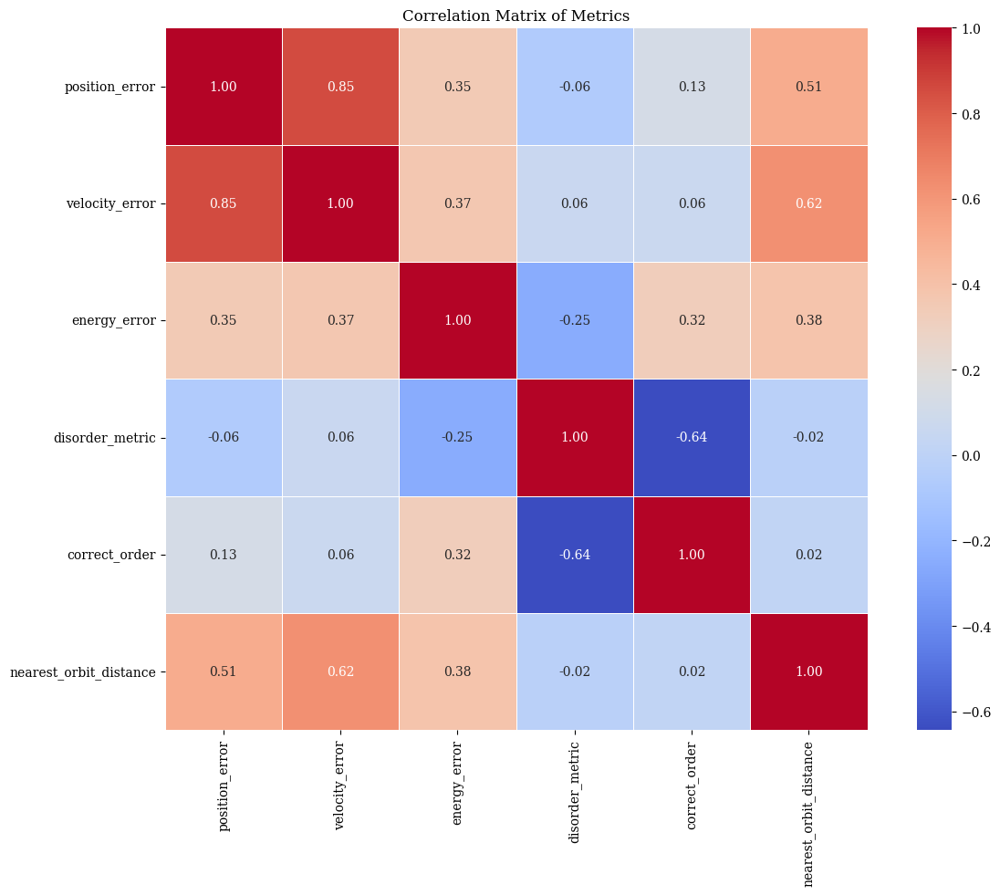

In [191]:
plot_corr_matrix(generation_df.drop(columns=not_to_show_columns, errors='ignore'))

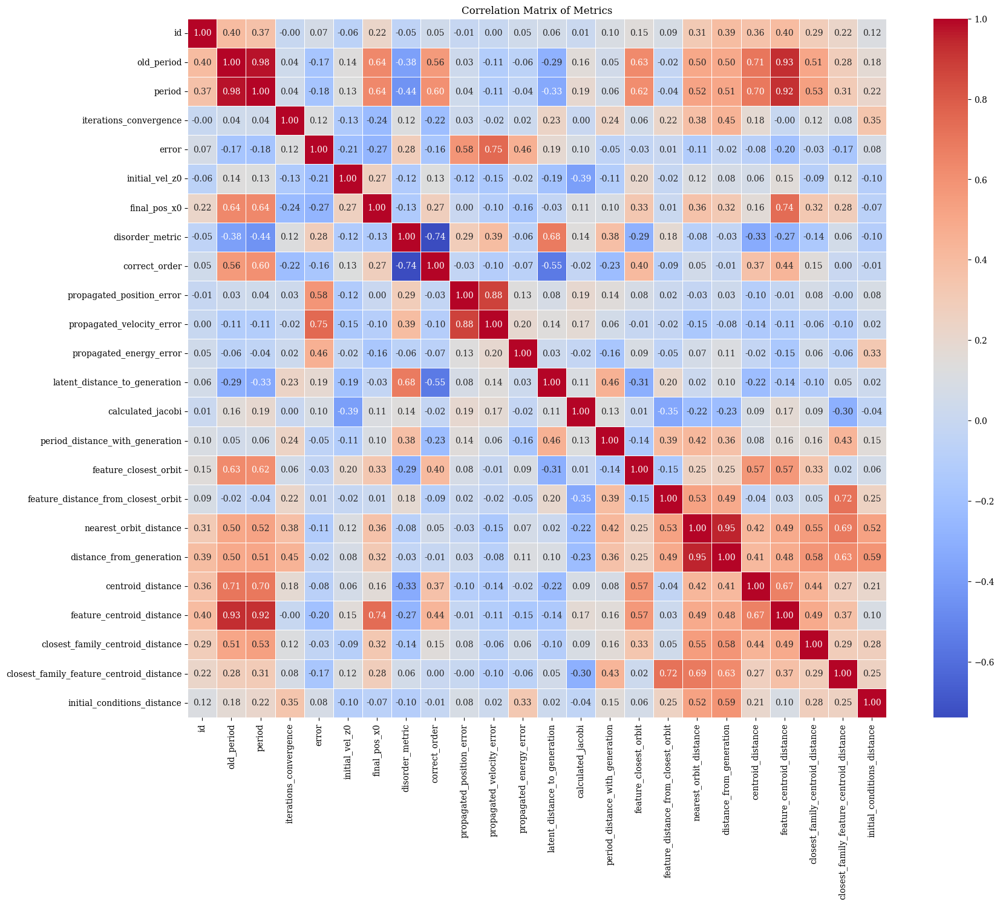

In [192]:
plot_corr_matrix(refined_orbits_df.drop(columns=not_to_show_columns, errors='ignore'), figsize=(20,15))

# Check Discovery

Calculate Full Centroid Distances

In [193]:
# Recalculate distance from latent space centroids
closest_family_centroid, closest_family_centroid_distance = find_nearest_points_batch(refined_latent_means, full_centroid_means, n=1, distance_metric=params['distance_metric'])
refined_orbits_df['closest_family_full_centroid'] = closest_family_centroid
refined_orbits_df['closest_family_full_centroid_distance'] = closest_family_centroid_distance

In [194]:
family_mapping = full_orbit_df['id_class'].to_dict()

def get_class_name(orbit_id):
    return family_mapping.get(orbit_id, None)

refined_orbits_df['family_of_feature_closest_orbit'] = refined_orbits_df['feature_closest_orbit'].apply(get_class_name)
refined_orbits_df['family_of_closest_orbit'] = refined_orbits_df['nearest_orbit'].apply(get_class_name)
refined_orbits_df.to_csv(refined_orbits_df_path, index=False)
refined_orbits_df.shape

(96, 43)

In [195]:
family_columns = ['family_of_feature_closest_orbit', 'family_of_closest_orbit', 'closest_family_feature_centroid','closest_family_full_centroid']
filter_condition = refined_orbits_df[family_columns].isin(discarded_family_ids).any(axis=1)
close_discovery_df = refined_orbits_df[filter_condition]
close_discovery_df.shape

(44, 43)

In [196]:
close_discovery_df[family_columns].head()

,family_of_feature_closest_orbit,family_of_closest_orbit,closest_family_feature_centroid,closest_family_full_centroid
0,32.0,5.0,29,29
1,15.0,15.0,6,3
3,12.0,12.0,11,11
7,30.0,15.0,6,3
9,25.0,21.0,20,23


In [197]:
filter_condition = refined_orbits_df[['family_of_feature_closest_orbit', 'family_of_closest_orbit']].isin(discarded_family_ids).any(axis=1)
discovery_df = refined_orbits_df[filter_condition]
discovery_df.shape

(22, 43)

In [ ]:
family_orbit_columns = ['id','feature_closest_orbit', 'nearest_orbit', 'family_of_feature_closest_orbit', 'family_of_closest_orbit', 'closest_family_feature_centroid','closest_family_full_centroid']
discovery_df[family_orbit_columns]

,id,feature_closest_orbit,nearest_orbit,family_of_feature_closest_orbit,family_of_closest_orbit,closest_family_feature_centroid,closest_family_full_centroid
0,7,17970,17973,15.0,15.0,6,3
1,20,31163,18053,30.0,15.0,6,3
2,25,26992,23904,25.0,21.0,20,23
3,31,3884,18053,4.0,15.0,0,1
4,33,17650,17704,15.0,15.0,9,5
5,37,3881,18053,4.0,15.0,0,1
6,42,25368,28567,22.0,26.0,6,3
7,48,18007,18053,15.0,15.0,6,27
8,67,19873,18670,17.0,16.0,16,15
9,73,3882,18053,4.0,15.0,0,1


In [200]:
discarded_family_ids

[17.0, 4.0, 22.0, 7.0, 15.0, 29.0, 37.0, 11.0, 21.0, 14.0]

In [201]:
refinement_indexes = discovery_df.index.to_list()
feature_closest_orbit_indexes = discovery_df['feature_closest_orbit'].to_list()
nearest_orbit_indexes = discovery_df['nearest_orbit'].to_list()

discovery_refinement = reordered_refined_orbits[refinement_indexes]
feature_closest_orbits = full_data[feature_closest_orbit_indexes]
nearest_orbits = full_data[nearest_orbit_indexes]

In [202]:
refinement_and_closers = np.stack(
    (discovery_refinement, feature_closest_orbits, nearest_orbits),
    axis=1
)
refinement_and_closers.shape

(22, 3, 7, 100)

## Visualize

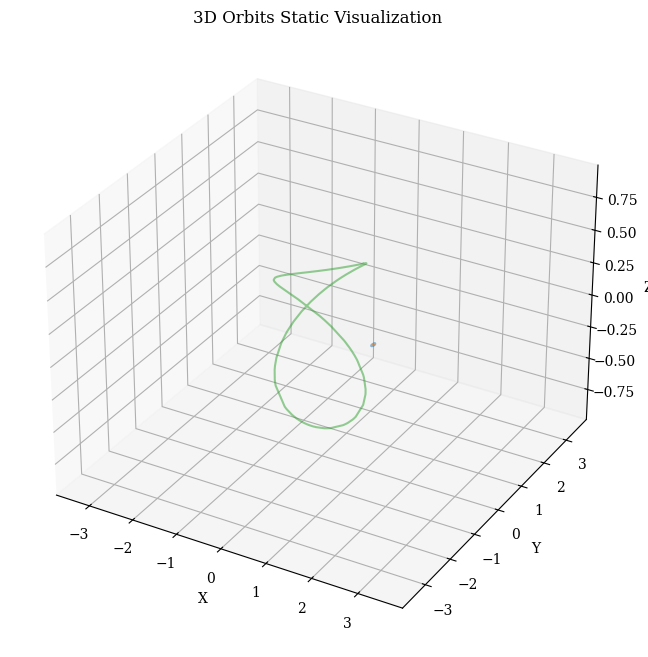

In [232]:
visualize_static_orbits(reordered_refined_orbits[:,1:,:], show_legend=False, orbit_indices=[1,7,9])

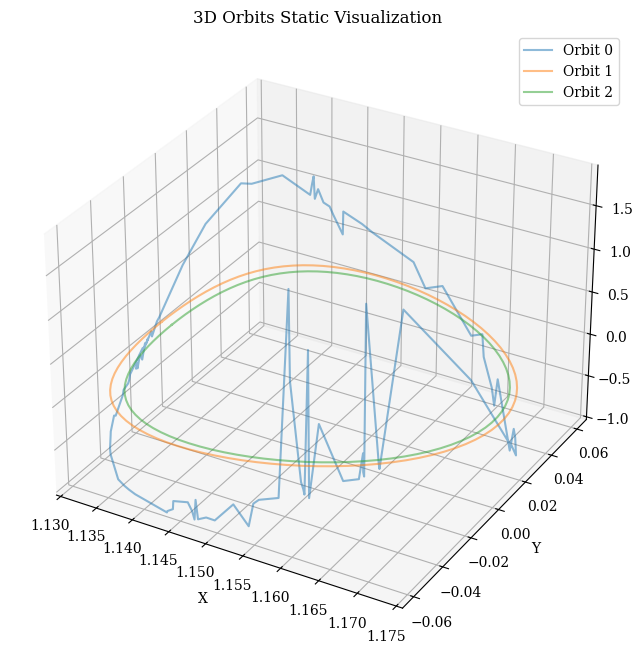

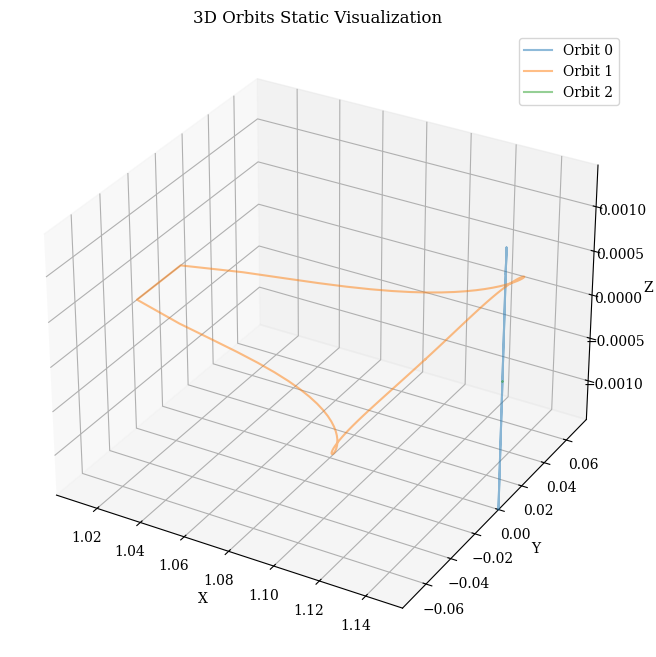

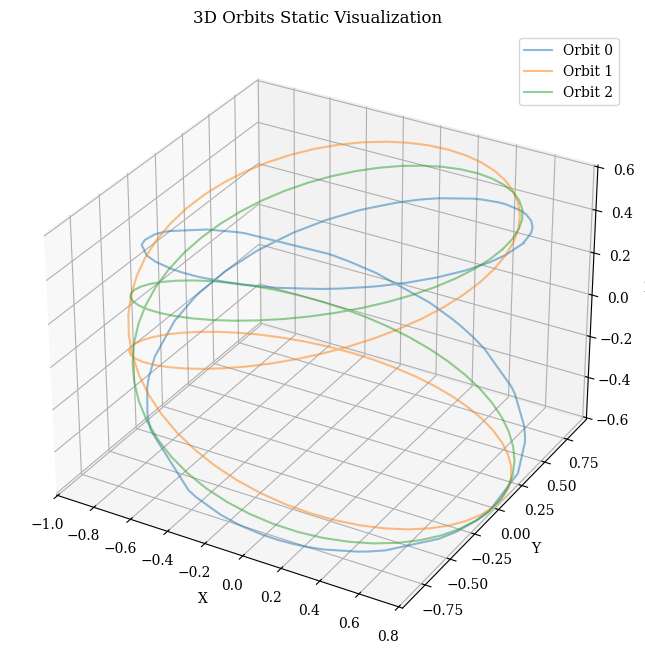

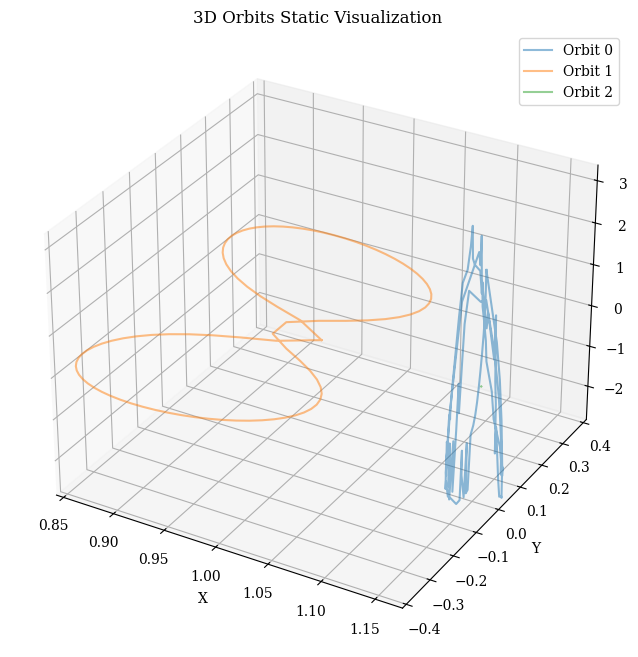

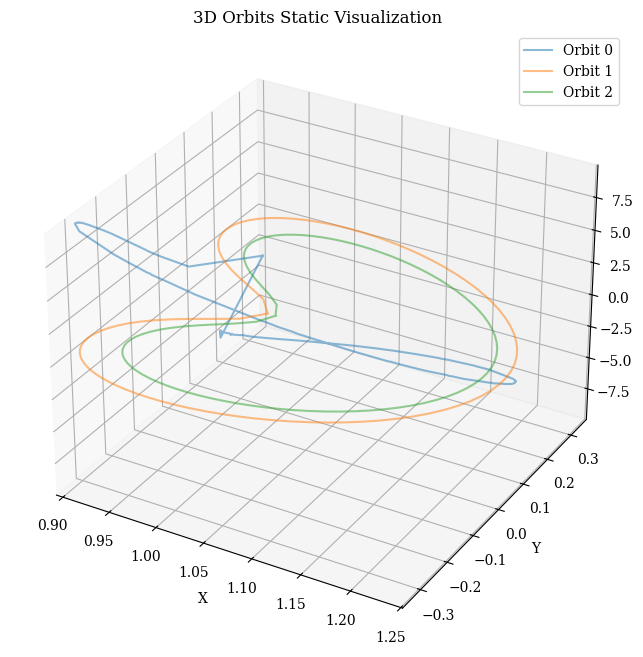

...

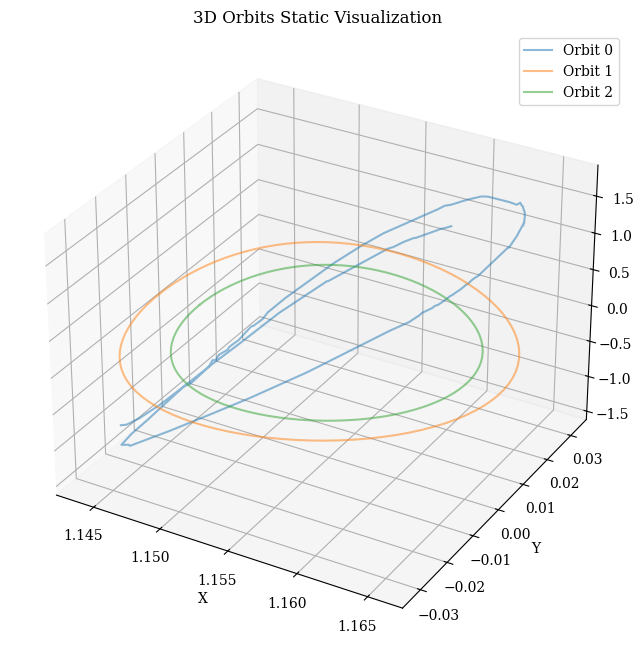

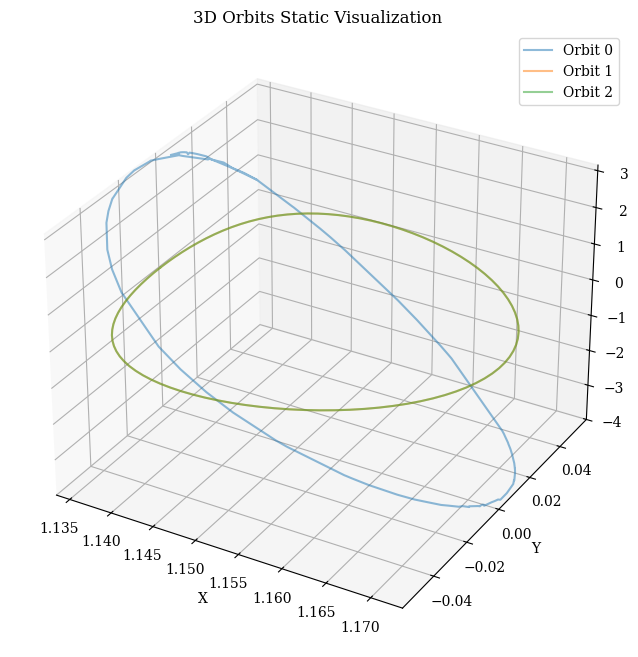

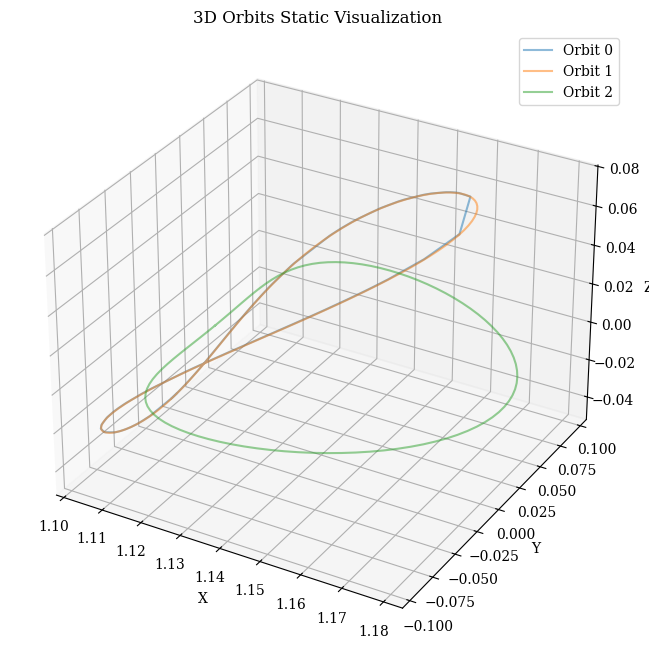

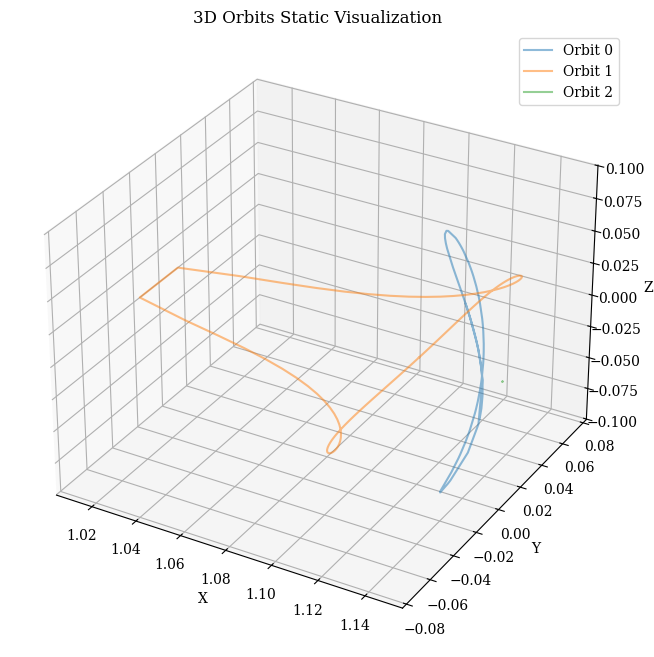

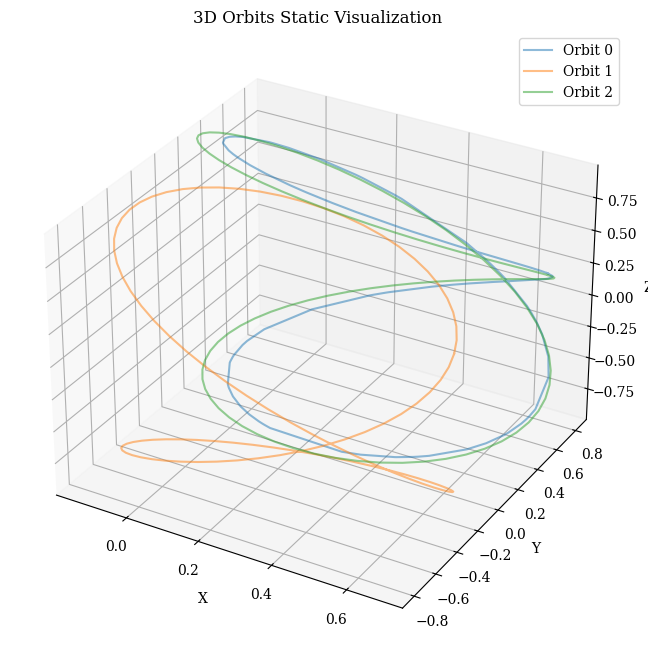

In [203]:
for i in range(len(refinement_and_closers)):
    visualize_static_orbits(refinement_and_closers[i,:,1:,:])

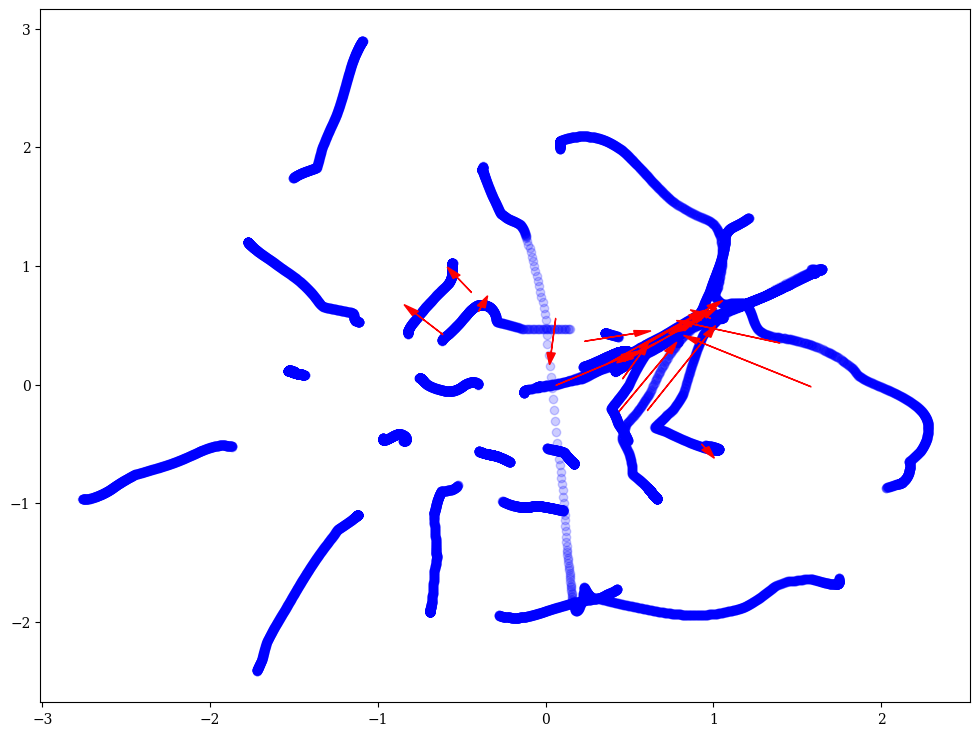

In [204]:
plot_combined_2d_latent_space(
    real_latent=latent_means, 
    synthetic_latent=generation_to_refinement[refinement_indexes],
    annotation_mode='numbers'
)

In [205]:
discovery_generation_indexes = discovery_df['id'].values
discovery_generation = generation[discovery_generation_indexes]
discovery_generation.shape

(22, 7, 100)

In [206]:
discovery_generation_and_refinement = np.stack(
    (discovery_generation, discovery_refinement),
    axis=1
)
discovery_generation_and_refinement.shape

(22, 2, 7, 100)

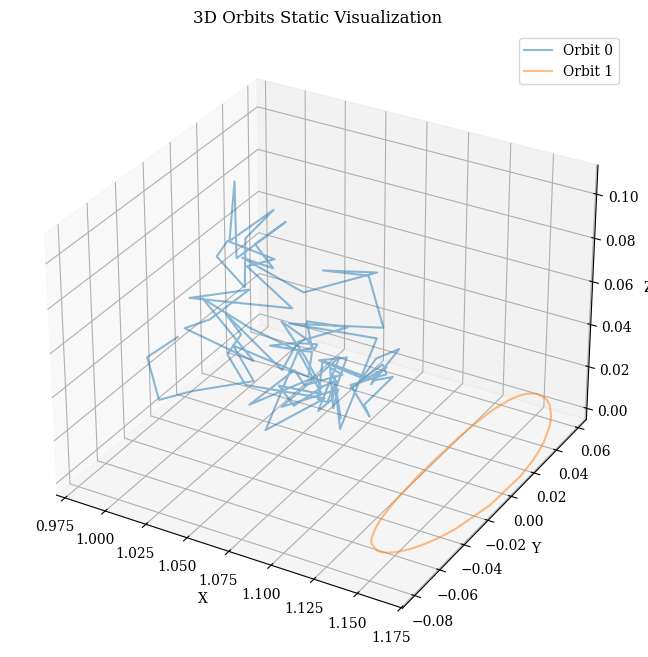

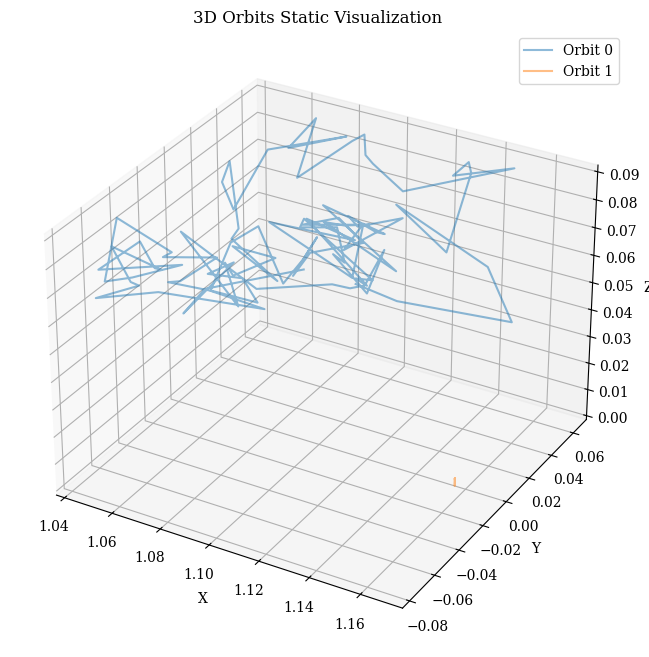

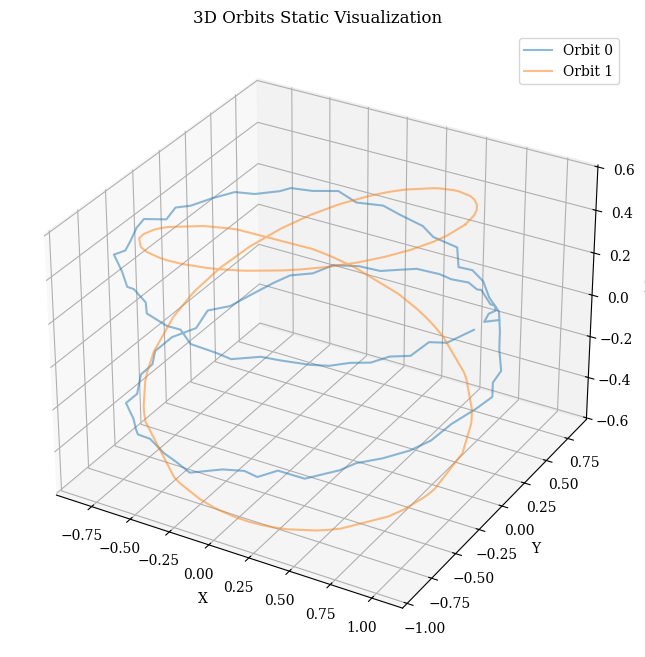

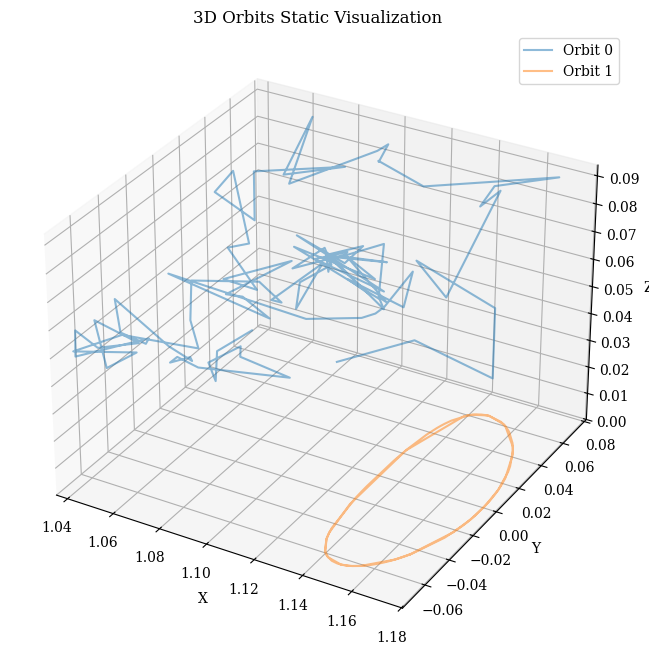

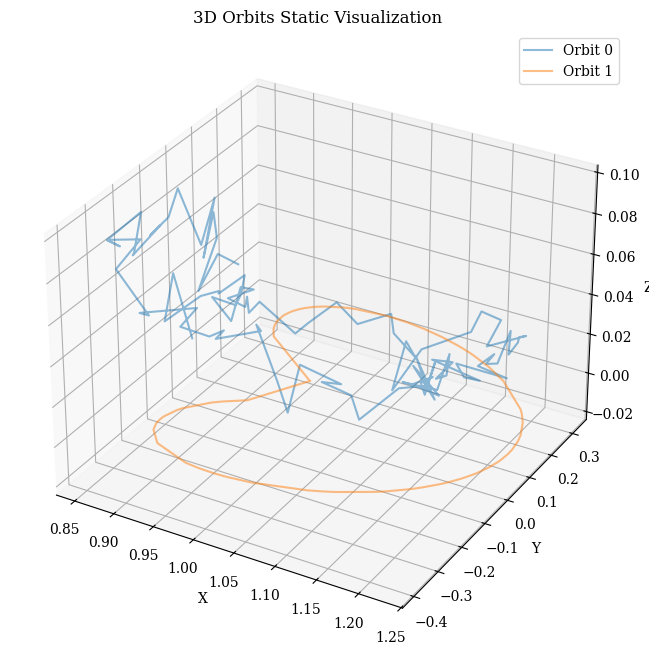

...

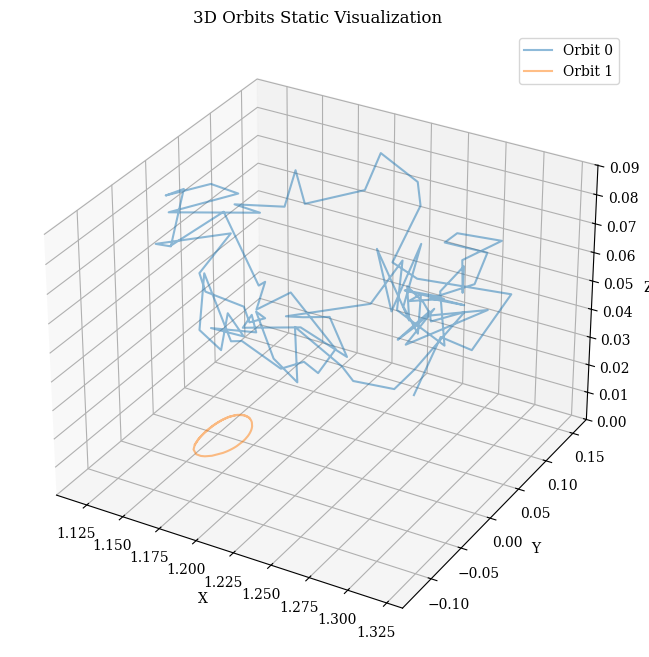

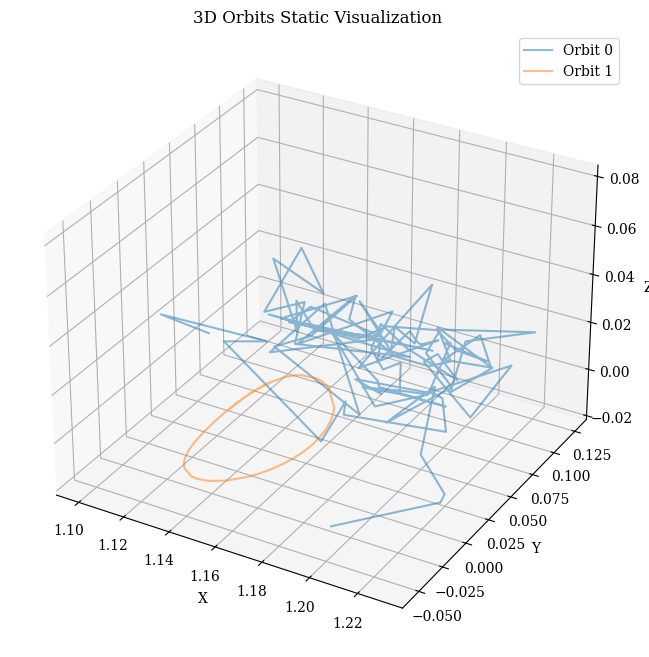

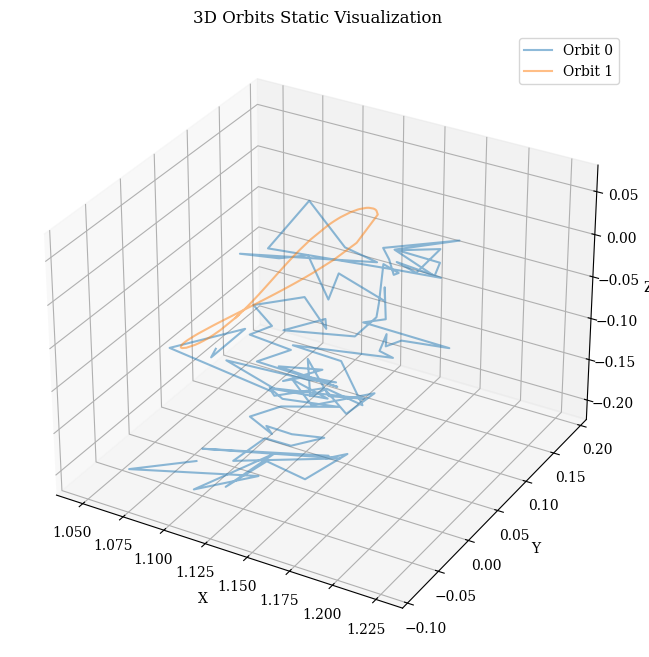

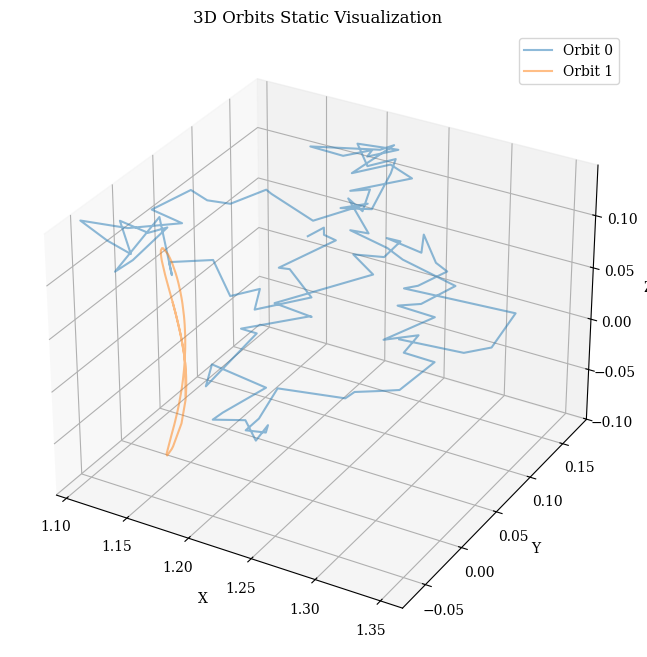

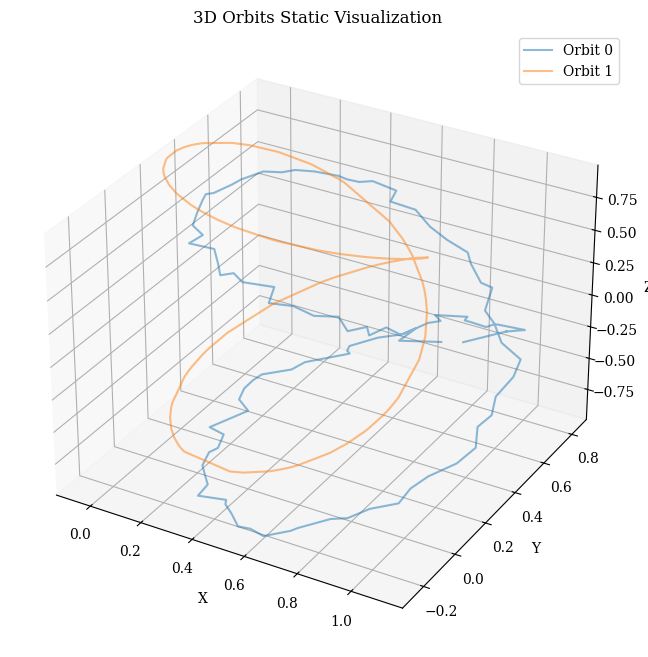

In [207]:
for i in range(len(discovery_generation_and_refinement)):
    visualize_static_orbits(discovery_generation_and_refinement[i,:,1:,:])